In [2]:
# import os 
# os.chdir('/home/erk26/newburghlab-drone/')

# from dronehacks.GBO_Corr_Class import *
# from dronehacks.Drone_Class import *
# import pandas as pd

# import pytz


import os
import numpy as np
from matplotlib.pyplot import *
import h5py
import datetime
import pytz
import pickle
import glob
from scipy.interpolate import griddata
import scipy.optimize as opt
from scipy.optimize import curve_fit
from scipy.optimize import leastsq
from scipy.optimize import least_squares

## Then import the beamcals module packages and initialize 'gbosite' class:
from beamcals import corr
from beamcals import concat
from beamcals import drone
from beamcals import bicolog
import beamcals.plotting_utils as pu
import beamcals.fitting_utils as fu
import beamcals.geometry_utils as gu
import beamcals.time_utils as tu
from beamcals.sites import site
gbosite=site.site('/home/erk26/newburghlabdrone/beamcals/beamcals/sites/GBO_config.npz')

In [3]:
class dict_to_class:
    def __init__(self,dictionary):
        for key in dictionary.keys():
            setattr(self,key,dictionary[key])

class dict_to_class_cut:
    def __init__(self,dictionary):
        for key in dictionary.keys():
            if 'bg' not in key or 'sub' in key:
                setattr(self,key,dictionary[key])

In [4]:
## Flight 1) cross-pol stuff, homing over dish
gaindir='/hirax/GBO_Oct_2021/TONE_ACQ/digital_gains/20211020T215858Z_yale_drone_yale_digitalgain/'
datadir='/hirax/GBO_Oct_2021/TONE_ACQ/20211020T215858Z_yale_drone/corr/20211020T215911Z/'
test=Corr_Data(n_channels=16,chmap=GBO8_chmap,Data_Directory=datadir,Gain_Directory=gaindir)

## Read Drone Data: 
drone_directory='/hirax/all_drone_data/datcon_csv/'
ndishes=8
test_drone=Drone_Data(dronedir=drone_directory,\
                                FLYTAG='FLY608.csv',\
                                Origin_llh=GBO_HIRAX_DISH_0,\
                                Origin_key='Hirax_Dish_0',\
                                dkeys=Array_Keys[:ndishes],\
                                dcoords=Array_Coords[:ndishes],\
                                dpointings=Array_Pointings[:ndishes],\
                                dpols=Array_Pols[:ndishes])

test_concat=CONCAT(CORRDATCLASS=test,DRONEDATCLASS=test_drone)


NameError: name 'Corr_Data' is not defined

In [5]:
# OCTOBER 21 FLIGHT READ IN

keys1021 = [entry.split('dicts/')[1].split('.')[0] for entry in glob.glob('/hirax/GBO_Oct_2021/TONE_ACQ/flight_dicts/20211021T13514*')]
keys1021.sort()

dict1021 = {}
for key in keys1021:
    with open('/hirax/GBO_Oct_2021/TONE_ACQ/flight_dicts/'+key+'.pkl', 'rb') as f:
        loaded_dict = pickle.load(f)
        f.close()
    dict1021[key] = dict_to_class_cut(loaded_dict)
    print(key)


20211021T135147Z


In [6]:
# 20211020T215858Z

In [7]:
keys1021

['20211021T135147Z']

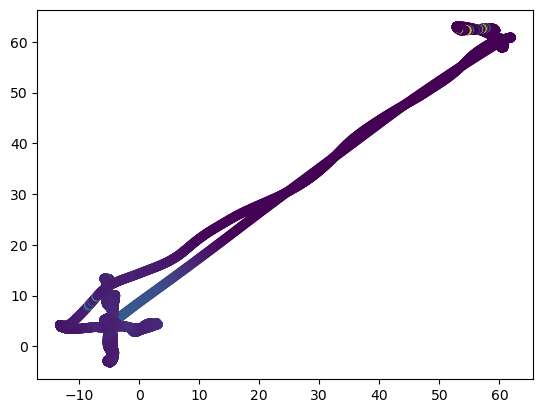

In [8]:
scatter(dict1021['20211021T135147Z'].drone_xyz_LC_interp[:,0], dict1021['20211021T135147Z'].drone_xyz_LC_interp[:,1], c = dict1021['20211021T135147Z'].V[:,900,0])

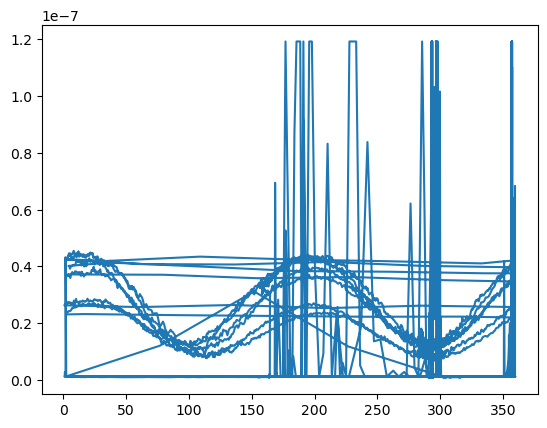

In [9]:
plot(dict1021['20211021T135147Z'].drone_yaw_interp, dict1021['20211021T135147Z'].V[:,900,0])




# want to use below bc uses drone data not annie gps for yaw

In [10]:
## Flight 1) cross-pol stuff, homing over dish
GBO8_chmap=np.array([0,1,3,2,4,5,7,6,9,8,10,11,12,13,14,15])

gaindir='/hirax/GBO_Oct_2021/TONE_ACQ/digital_gains/20211020T215858Z_yale_drone_yale_digitalgain/'
datadir='/hirax/GBO_Oct_2021/TONE_ACQ/20211020T215858Z_yale_drone/corr/20211020T215911Z/'

test_corr=corr.Corr_Data(Data_Directory=datadir,Gain_Directory=gaindir,site_class=gbosite)

## Read Drone Data: 
dronedir='/hirax/all_drone_data/datcon_csv/'
ndishes=8

droneflight = 'FLY608.csv'
dronedir='/hirax/all_drone_data/datcon_csv/'
test_drone=drone.Drone_Data(Drone_Directory=dronedir,FLYTAG=droneflight+'',site_class=gbosite)

Initializing Correlator Class using:
  --> /hirax/GBO_Oct_2021/TONE_ACQ/20211020T215858Z_yale_drone/corr/20211020T215911Z/
  --> Arrays initialized with shape (60, 256, 1024, 16)
Assigning array values by reading in data files:
  --> Loading File: 0059/0059
  --> Finished. Reshaping arrays.
Initializing drone data via datcon_csv routine: FLY608.csv
  --> Skipping rows 1 to 499 to eliminate NAN values
  --> Attempting to load position data from RTK
    --> RTK Data not found for this data file...
  --> Loading position data from GPS(0) instead:
Timestamp interpolation succeeded
  --> generating llh, geocentric cartesian, local cartesian, and local spherical coordinates.
  --> generating dish and receiver line of sight coordinates.


In [11]:
concattest=concat.CONCAT(CORRDATCLASS=test_corr,DRONEDATCLASS=test_drone,\
                             load_yaml=True,traceback=True,save_traceback=False)

test_concat = concattest

Initializing CONCAT CLASS with active traceback using:
  --> /hirax/GBO_Oct_2021/TONE_ACQ/20211020T215858Z_yale_drone/corr/20211020T215911Z/
  --> FLY608.csv
  --> Traceback outputs will not be saved...
Searching for previous config file:
  --> Checking directory for config_FLY608_20211020T215858Z.yaml:
    --> FILE NOT FOUND
    --> Parameters can not be imported...
Interpolating drone coordinates for each correlator timestamp:
  --> correlator timestamp axis contains 12551 elements
  --> drone timestamp axis contains 7107 elements


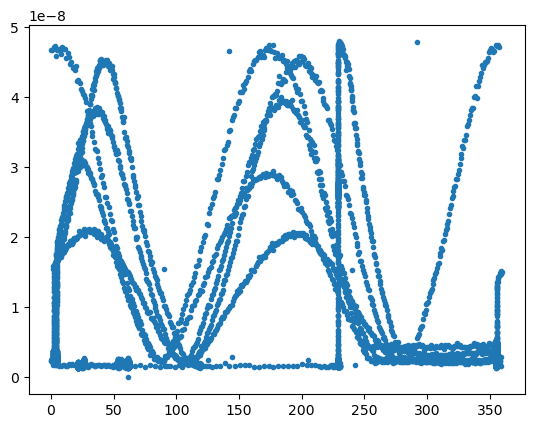

In [12]:
plot(concattest.drone_yaw_interp, concattest.V[:,600,0], '.')


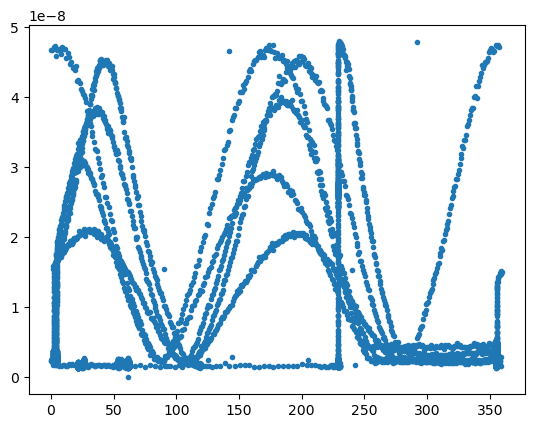

In [13]:
plot(concattest.drone_yaw_interp, concattest.V[:,600,0], '.')


In [14]:
def find_indx(array, value):
    array = np.asarray(array)
    idx = (np.abs(array - value)).argmin()
    return(idx)

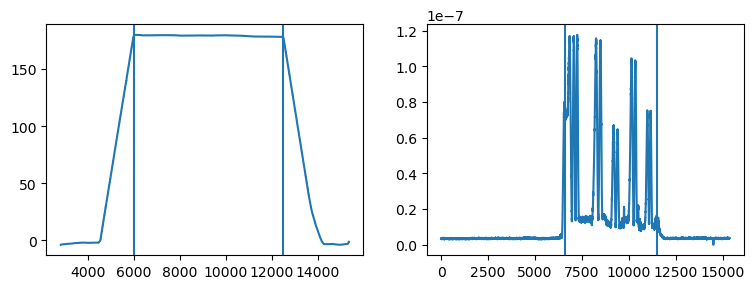

In [15]:
figure(figsize = (9,3))
subplot(1,2,1)
plot(test_concat.drone_xyz_LC_interp[:,2])
axvline(6000)
axvline(12500)

subplot(1,2,2)
plot(test_concat.V[:,900,0])
axvline(6600)
axvline(11500)

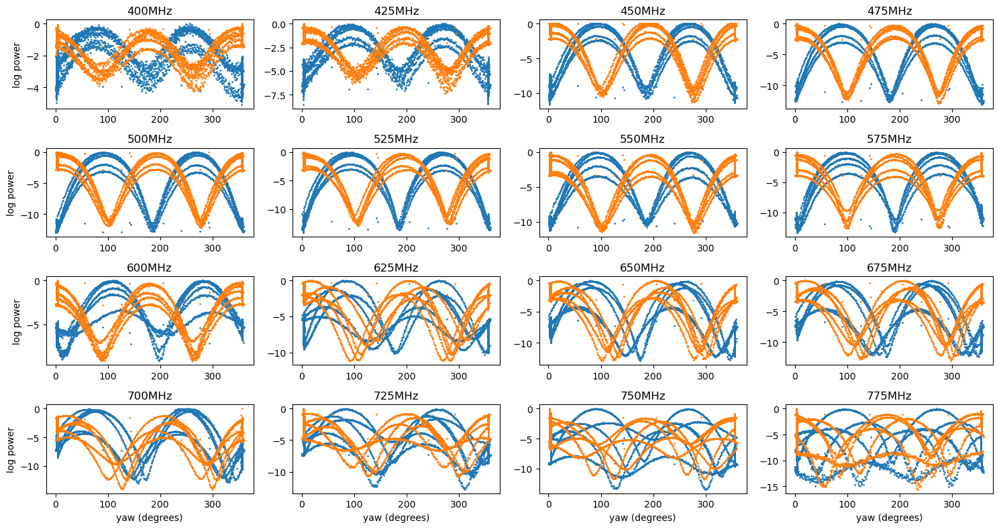

In [16]:
lb = 6600
ub = 11500
offset = 100

fig = figure(figsize = (15,8))
for i, freq1 in enumerate(np.arange(400,800,25)):
    freq = find_indx(test_concat.freq, freq1)
    ax = fig.add_subplot(4,4,i+1)
    for j in np.arange(0,2,1):
        ax.plot(test_concat.drone_yaw_interp[lb+offset:ub+offset], 10*np.log10(test_concat.V[:,freq,j][lb:ub])\
                -np.max(10*np.log10(test_concat.V[:,freq,j][lb:ub])), '.', markersize = 2)
    ax.set_title(str(freq1)+'MHz')
    if i%4 == 0: ax.set_ylabel('log power')
    if i in range(12,16): ax.set_xlabel('yaw (degrees)')
#wtf
tight_layout()
show()

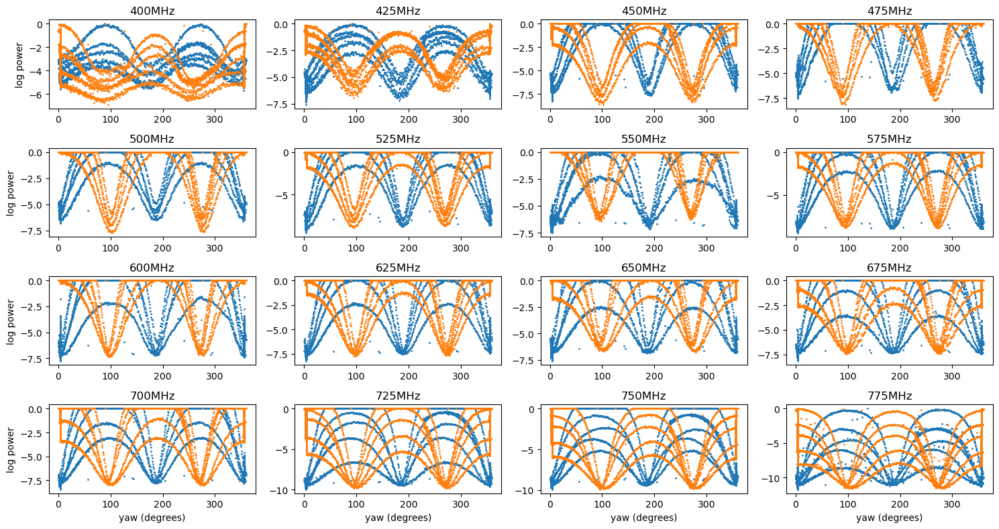

In [17]:
lb = 6600
ub = 11500
offset = 100

fig = figure(figsize = (15,8))
for i, freq1 in enumerate(np.arange(400,800,25)):
    freq = find_indx(test_concat.freq, freq1)
    ax = fig.add_subplot(4,4,i+1)
    for j in np.arange(6,8,1):
        ax.plot(test_concat.drone_yaw_interp[lb+offset:ub+offset], 10*np.log10(test_concat.V[:,freq,j][lb:ub])\
                -np.max(10*np.log10(test_concat.V[:,freq,j][lb:ub])), '.', markersize = 2)
    ax.set_title(str(freq1)+'MHz')
    if i%4 == 0: ax.set_ylabel('log power')
    if i in range(12,16): ax.set_xlabel('yaw (degrees)')
#wtf
tight_layout()
show()

ok ... need to figure out what discrepancy is here ,, 


update: timing offset

# read in day before data

In [18]:
# ## Flight 1) cross-pol stuff, homing over dish
# GBO8_chmap=np.array([0,1,3,2,4,5,7,6,9,8,10,11,12,13,14,15])


# gaindir='/hirax/GBO_Oct_2021/TONE_ACQ/digital_gains/20211020T215858Z_yale_drone_yale_digitalgain/'
# datadir='/hirax/GBO_Oct_2021/TONE_ACQ/processed_new/20211020T215858Z_yale_drone/corr/20211020T215911Z/'

# test_corr=corr.Corr_Data(Data_Directory=datadir,Gain_Directory=gaindir,site_class=gbosite)

# ## Read Drone Data: 
# dronedir='/hirax/all_drone_data/datcon_csv/'
# ndishes=8

# droneflight = 'FLY608.csv'
# dronedir='/hirax/all_drone_data/datcon_csv/'
# test_drone=drone.Drone_Data(Drone_Directory=dronedir,FLYTAG=droneflight+'',site_class=gbosite)

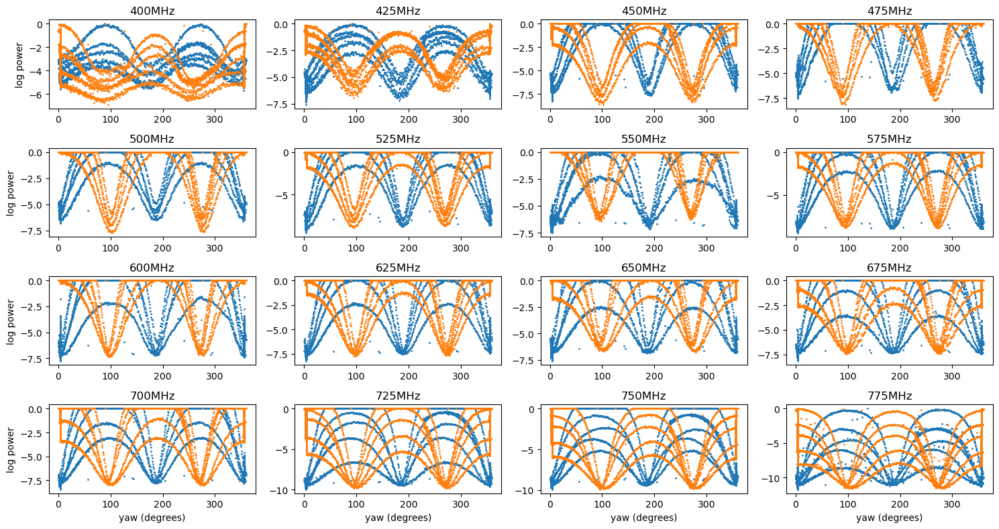

In [19]:
lb = 6600
ub = 11500
offset = 100

fig = figure(figsize = (15,8))
for i, freq1 in enumerate(np.arange(400,800,25)):
    freq = find_indx(test_concat.freq, freq1)
    ax = fig.add_subplot(4,4,i+1)
    for j in np.arange(6,8,1):
        ax.plot(test_concat.drone_yaw_interp[lb+offset:ub+offset], 10*np.log10(test_concat.V[:,freq,j][lb:ub])\
                -np.max(10*np.log10(test_concat.V[:,freq,j][lb:ub])), '.', markersize = 2)
    ax.set_title(str(freq1)+'MHz')
    if i%4 == 0: ax.set_ylabel('log power')
    if i in range(12,16): ax.set_xlabel('yaw (degrees)')
#wtf
tight_layout()
show()

To do:
- isolate individual spins
- 


In [20]:
a = test_concat.drone_xyz_LC_interp

inds = [np.where((a[:,0] < 20)), np.where((a[:,1] < 20))]


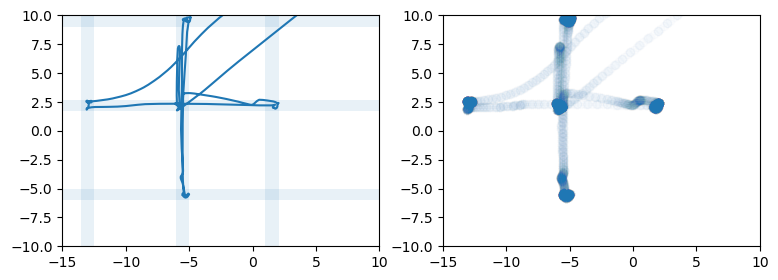

(array([ 772.,   73.,  217., 2859.,  228.,  442.,  460.,   52.,   62.,
          67.]),
 array([-5.78423832, -3.21671435, -0.64919038,  1.9183336 ,  4.48585757,
         7.05338154,  9.62090551, 12.18842948, 14.75595345, 17.32347743,
        19.8910014 ]),
 <BarContainer object of 10 artists>)

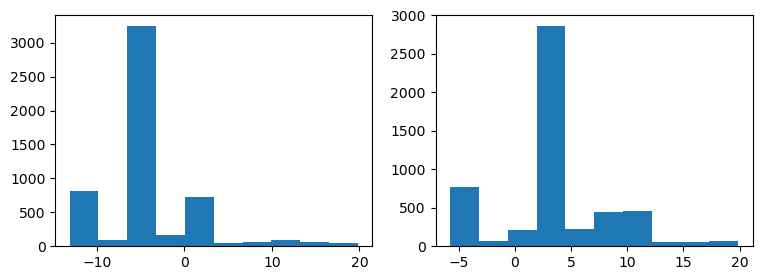

In [21]:
figure(figsize = (9,3))
subplot(1,2, 1)
plot(test_concat.drone_xyz_LC_interp[:,0], test_concat.drone_xyz_LC_interp[:,1])
axhspan(1.7,2.7, alpha = 0.1)
axhspan(9,10, alpha = 0.1)
axhspan(-6,-5, alpha = 0.1)

axvspan(-6,-5, alpha = 0.1)
axvspan(1,2.1, alpha = 0.1)
axvspan(-13.5,-12.5, alpha = 0.1)
ylim(-10,10)
xlim(-15,10)

subplot(1,2, 2)
plot(test_concat.drone_xyz_LC_interp[:,0], test_concat.drone_xyz_LC_interp[:,1], 'o', alpha = 0.01)
ylim(-10,10)
xlim(-15,10)
show()

figure(figsize = (9,3))
subplot(1,2, 1)
hist(test_concat.drone_xyz_LC_interp[:,0][inds[0]])
subplot(1,2, 2)
hist(test_concat.drone_xyz_LC_interp[:,1][inds[1]])


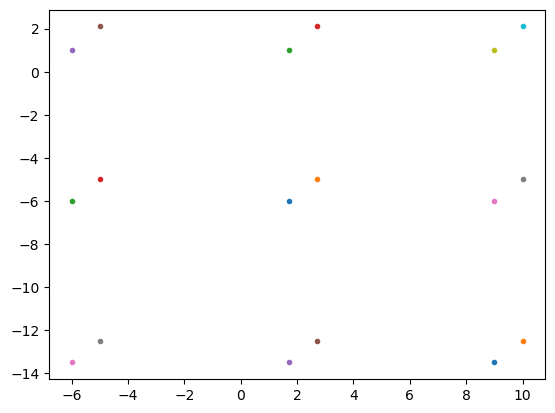

In [22]:
bounds_x = [(1.7,2.7), (9,10), (-6,-5)]
bounds_y = [(-6,-5), (1,2.1), (-13.5,-12.5)]

for i in range(3):
    for j in range(3):
        plot(bounds_x[i][0], bounds_y[j][0],'.')
        plot(bounds_x[i][1], bounds_y[j][1],'.')

In [23]:
a = test_concat.drone_xyz_LC_interp

np.where(a[:,0])

# inds = [np.where((a[:,0] < 20)), np.where((a[:,1] < 20))]

# plot(test_concat.drone_xyz_LC_interp[:,0], test_concat.drone_xyz_LC_interp[:,1])


(array([    0,     1,     2, ..., 15357, 15358, 15359]),)

In [24]:
indsx = []
[indsx.append(np.where((bounds_x[i][0] < a[:,0]) & (a[:,0] < bounds_x[i][1]))[0]) for i in range(3)]


[None, None, None]

In [25]:
indsx= [np.where((bounds_x[i][0] < a[:,0]) & (a[:,0] < bounds_x[i][1]))[0] for i in range(3)]
indsy= [np.where((bounds_y[i][0] < a[:,1]) & (a[:,1] < bounds_y[i][1]))[0] for i in range(3)]


indsx= [np.where((bounds_x[i][0] < a[:,1]) & (a[:,1] < bounds_x[i][1]))[0] for i in range(3)]
indsy= [np.where((bounds_y[i][0] < a[:,0]) & (a[:,0] < bounds_y[i][1]))[0] for i in range(3)]
# [[]+indsx[i] for i in range(3)]


In [26]:
len(indsx[0])+len(indsx[1])+len(indsx[2])


4013

In [27]:
indsx1 = list(indsx[0])+list(indsx[1])+list(indsx[2])
indsy1 = list(indsy[0])+list(indsy[1])+list(indsy[2])


In [28]:
# plot(indsx1)
# plot(indsy1)

inds = np.intersect1d(indsx1,indsy1)

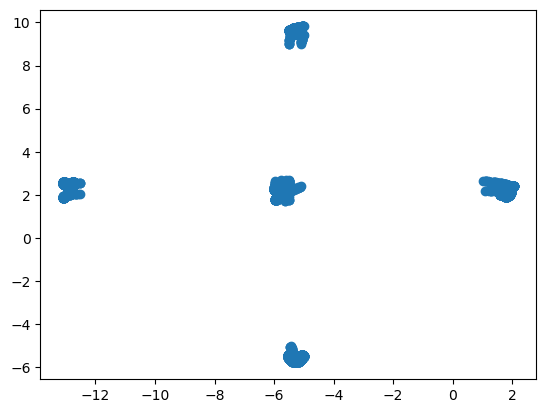

In [29]:
plot(test_concat.drone_xyz_LC_interp[inds,0], test_concat.drone_xyz_LC_interp[inds,1], 'o')
show()
# for i in range(3):
#     for j in range(3):
#         plot(bounds_y[i][0], bounds_x[j][0],'k.')
#         plot(bounds_y[i][1], bounds_x[j][1],'k.')


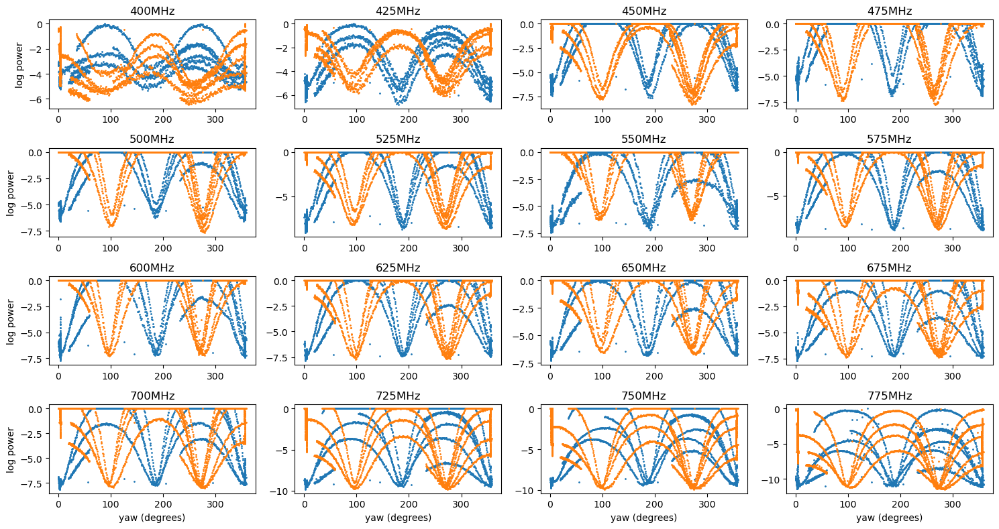

In [30]:
offset = 100

fig = figure(figsize = (15,8))
for i, freq1 in enumerate(np.arange(400,800,25)):
    freq = find_indx(test_concat.freq, freq1)
    ax = fig.add_subplot(4,4,i+1)
    for j in np.arange(6,8,1):
        ax.plot(test_concat.drone_yaw_interp[offset:][inds], 10*np.log10(test_concat.V[inds,freq,j])\
                -np.max(10*np.log10(test_concat.V[:,freq,j][inds])), '.', markersize = 2)
    ax.set_title(str(freq1)+'MHz')
    if i%4 == 0: ax.set_ylabel('log power')
    if i in range(12,16): ax.set_xlabel('yaw (degrees)')
#wtf
tight_layout()
show()

# retry finding bounds


5/14 goal: fit sine wave to spins

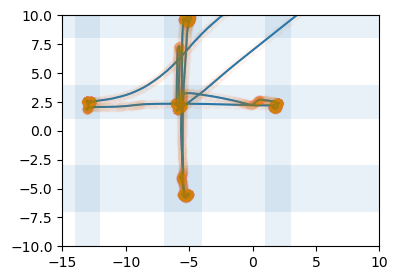

In [31]:

figure(figsize = (9,3))
subplot(1,2, 1)
plot(test_concat.drone_xyz_LC_interp[:,0], test_concat.drone_xyz_LC_interp[:,1])

# for i in indsx1:

axhspan(1,4, alpha = 0.1)
axhspan(8,11, alpha = 0.1)
axhspan(-7,-3, alpha = 0.1)

axvspan(-7,-4, alpha = 0.1)
axvspan(1,3, alpha = 0.1)
axvspan(-14,-12, alpha = 0.1)
ylim(-10,10)
xlim(-15,10)

plot(test_concat.drone_xyz_LC_interp[:,0], test_concat.drone_xyz_LC_interp[:,1], 'o', alpha = 0.01)
ylim(-10,10)
xlim(-15,10)
show()

In [32]:
bounds_x = [(1,4),(8,11),(-7,-3)]
bounds_y = [(-7,-4),(1,3),(-14,-12)]

indsx= [np.where((bounds_x[i][0] < a[:,0]) & (a[:,0] < bounds_x[i][1]))[0] for i in range(3)]
indsy= [np.where((bounds_y[i][0] < a[:,1]) & (a[:,1] < bounds_y[i][1]))[0] for i in range(3)]


indsx= [np.where((bounds_x[i][0] < a[:,1]) & (a[:,1] < bounds_x[i][1]))[0] for i in range(3)]
indsy= [np.where((bounds_y[i][0] < a[:,0]) & (a[:,0] < bounds_y[i][1]))[0] for i in range(3)]
# [[]+indsx[i] for i in range(3)]
inds = np.intersect1d(indsx1,indsy1)

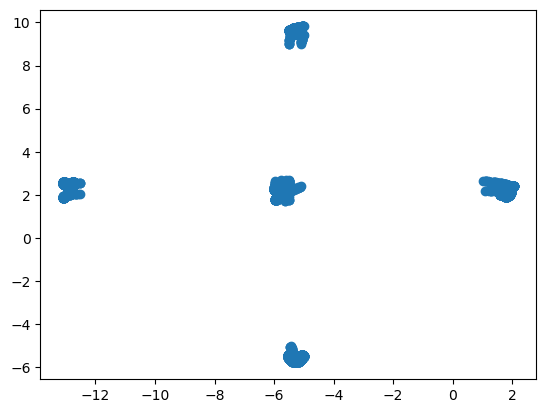

In [33]:
plot(test_concat.drone_xyz_LC_interp[inds,0], test_concat.drone_xyz_LC_interp[inds,1], 'o')
show()
# for i in range(3):
#     for j in range(3):
#         plot(bounds_y[i][0], bounds_x[j][0],'k.')
#         plot(bounds_y[i][1], bounds_x[j][1],'k.')


In [34]:
# indsx

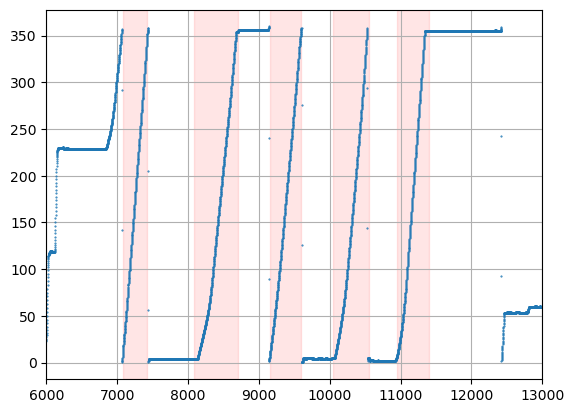

In [35]:
plot(test_concat.drone_yaw_interp, '.', markersize = 1)
# # plot(test_concat.drone_xyz_LC_interp[:,2])
# plot(test_concat.drone_xyz_LC_interp[:,0])
# plot(test_concat.drone_xyz_LC_interp[:,1])

# for i in [7080, 7450,8090,8700,9150,9600,10050,10550,10950,11400]:
#     axvline(i, color = 'k')
    
    
for i in [(7080, 7420),(8090,8700),(9150,9600),(10050,10550),(10950,11400)]:
    axvspan(i[0],i[1],color = 'r', alpha = 0.1)
    
xlim(6000,13000)
grid()

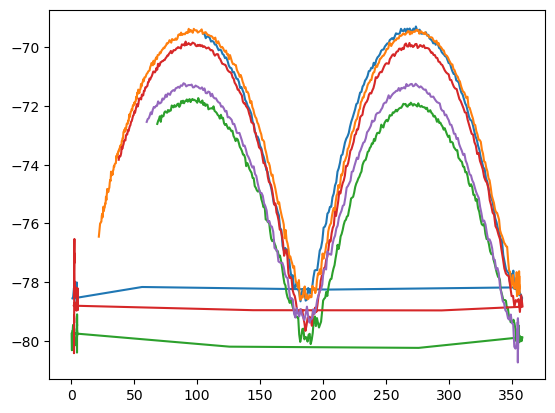

In [36]:
for i in [(7080, 7420),(8090,8700),(9150,9600),(10050,10550),(10950,11400)]:
# for i in [(10950,11400)]:
    plot(test_concat.drone_yaw_interp[offset:][i[0]:i[1]], 10*np.log10(test_concat.V[i[0]:i[1],900,0]))
show()

In [37]:
# def sin_fun(x,a,b,c):
#     return a*np.sin(b*x)+c

def sin_fun(x,*params):
    [a,b,c,d] = params
#     return a*np.sin(b*x*np.pi/180+c)+d    
    return a*np.sin(b*x*np.pi/180-c*np.pi/180)+d   

def sin_fun2(x,*params):
    
    [a,b,c,d] = params
#     return a*np.sin(b*x*np.pi/180+c)+d    
    return a*np.sin(b*(x-c)*np.pi/180)+d   
# 

def cos_fun(x,*params):
    
    [a,b,c,d] = params
#     return a*np.sin(b*x*np.pi/180+c)+d    
    return a*np.cos(b*(x-c)*np.pi/180)+d   

array([ 0.42434558,  2.06246178, 51.89726604,  0.56226743])

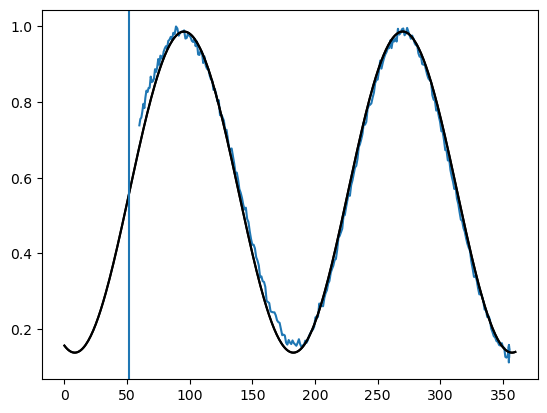

In [38]:
f = test_concat.V[i[0]:i[1],900,0]/test_concat.V[i[0]:i[1],900,0].max()

for i in [(10950,11400)]:
    plot(test_concat.drone_yaw_interp[offset:][i[0]:i[1]], f)


popt, pcov = opt.curve_fit(sin_fun, test_concat.drone_yaw_interp[offset:][i[0]:i[1]], f, p0=[1,2,1,1])
plot(np.linspace(0,360,360), sin_fun(np.linspace(0,360,360), *popt), 'k')

popt, pcov = opt.curve_fit(sin_fun2, test_concat.drone_yaw_interp[offset:][i[0]:i[1]], f, p0=[1,2,1,1])
plot(np.linspace(0,360,360), sin_fun2(np.linspace(0,360,360), *popt), 'k')

# plot(np.linspace(0,360,360), 0.42434558*np.sin(2.06246157*np.linspace(0,360,360)*np.pi/180-107.03611896*np.pi/180)+0.56226741)

axvline(popt[2])
popt

In [39]:
popt, pcov = opt.curve_fit(sin_fun, test_concat.drone_yaw_interp[offset:][i[0]:i[1]], \
                           1e7*(test_concat.V[i[0]:i[1],900,0]), p0=[1,2,1,1])


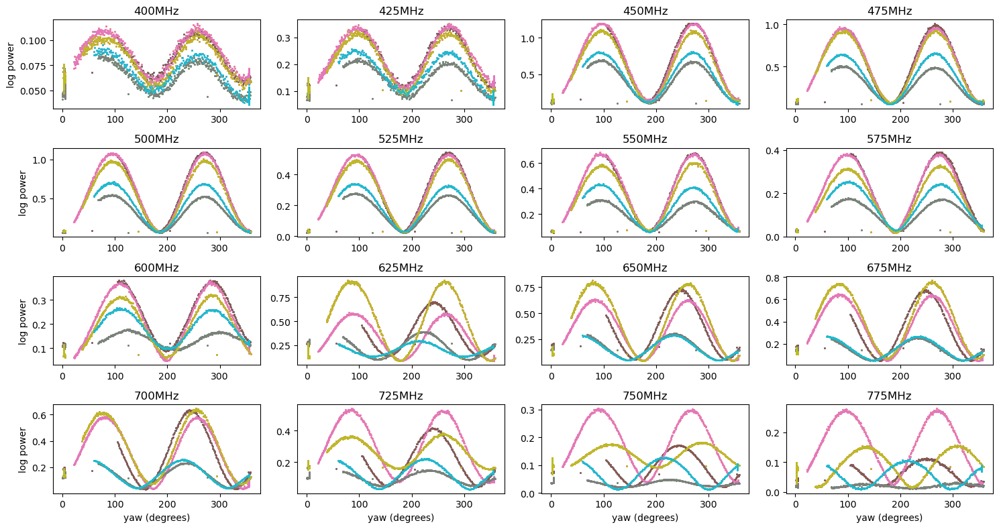

In [40]:
offset = 100
fig = figure(figsize = (15,8))
for i, freq1 in enumerate(np.arange(400,800,25)):
    freq = find_indx(test_concat.freq, freq1)
    ax = fig.add_subplot(4,4,i+1)
    for j in np.arange(6,8,1):
        
        for k in [(7080, 7420),(8090,8700),(9150,9600),(10050,10550),(10950,11400)]:
            ax.plot(test_concat.drone_yaw_interp[offset:][k[0]:k[1]], 1e7*(test_concat.V[k[0]:k[1],freq,0]), '.', markersize = 2)

        
#         ax.plot(test_concat.drone_yaw_interp[offset:][inds], 10*np.log10(test_concat.V[inds,freq,j])\
#                 -np.max(10*np.log10(test_concat.V[:,freq,j][inds])), '.', markersize = 2)
    ax.set_title(str(freq1)+'MHz')
    if i%4 == 0: ax.set_ylabel('log power')
    if i in range(12,16): ax.set_xlabel('yaw (degrees)')
#wtf
tight_layout()
show()


0 1


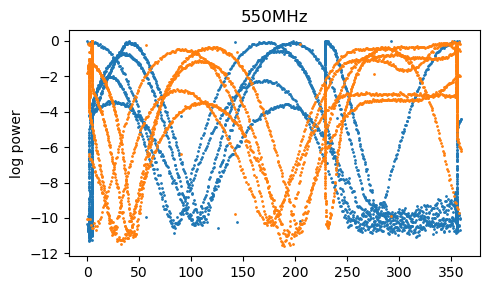

In [41]:
lb = 6600
ub = 11500
offset = 0

for chan in [(a,a+1) for a in np.arange(0,2,2)]:
    print(chan[0],chan[1])
    fig = figure(figsize = (5,3))
    for i, freq1 in enumerate([550]):
        freq = find_indx(test_concat.freq, freq1)
        ax = fig.add_subplot(1,1,i+1)
        for j in np.arange(chan[0],chan[1]+1,1):
            ax.plot(test_concat.drone_yaw_interp[lb+offset:ub+offset], 10*np.log10(test_concat.V[:,freq,j][lb:ub])\
                    -np.max(10*np.log10(test_concat.V[:,freq,j][lb:ub])), '.', markersize = 2)

    #         for k in [(7080, 7420),(8090,8700),(9150,9600),(10050,10550),(10950,11400)]:
    #             ax.plot(test_concat.drone_yaw_interp[offset:][k[0]:k[1]], 10*np.log10(test_concat.V[k[0]:k[1],freq,0])\
    #                     -np.max(10*np.log10(test_concat.V[:,freq,j][lb:ub])), '.', markersize = 2)

        ax.set_title(str(freq1)+'MHz')
        if i%4 == 0: ax.set_ylabel('log power')
        if i in range(12,16): ax.set_xlabel('yaw (degrees)')
    #wtf
#     suptitle(chan[0])
    tight_layout()
    show()

0 1


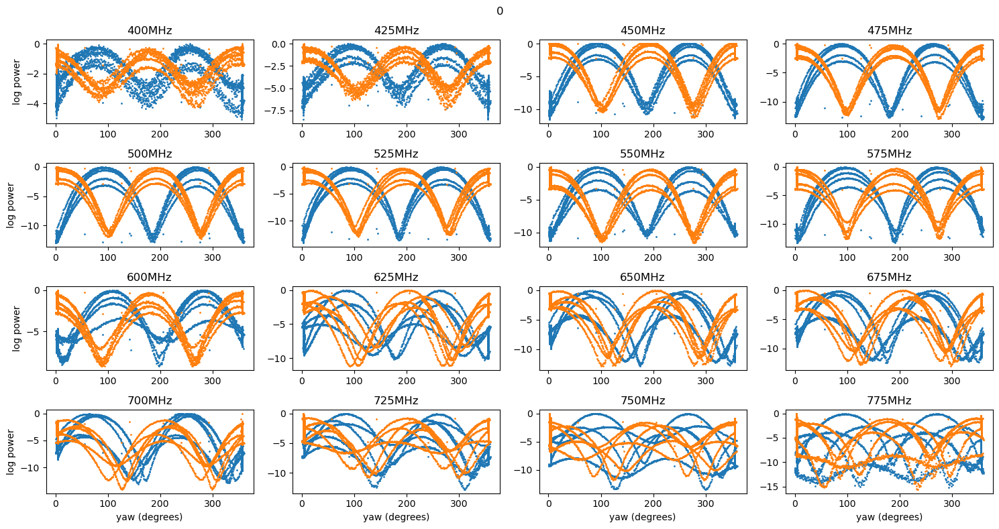

2 3


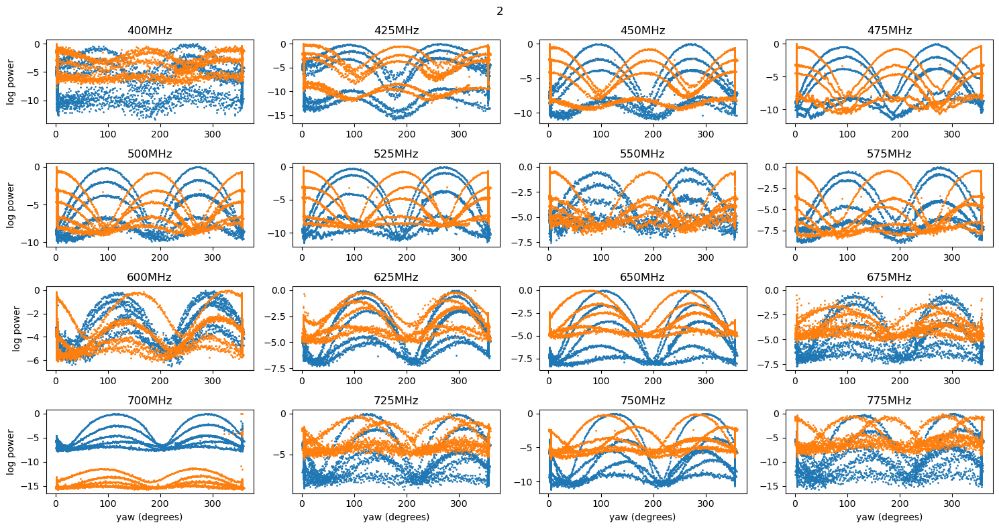

4 5


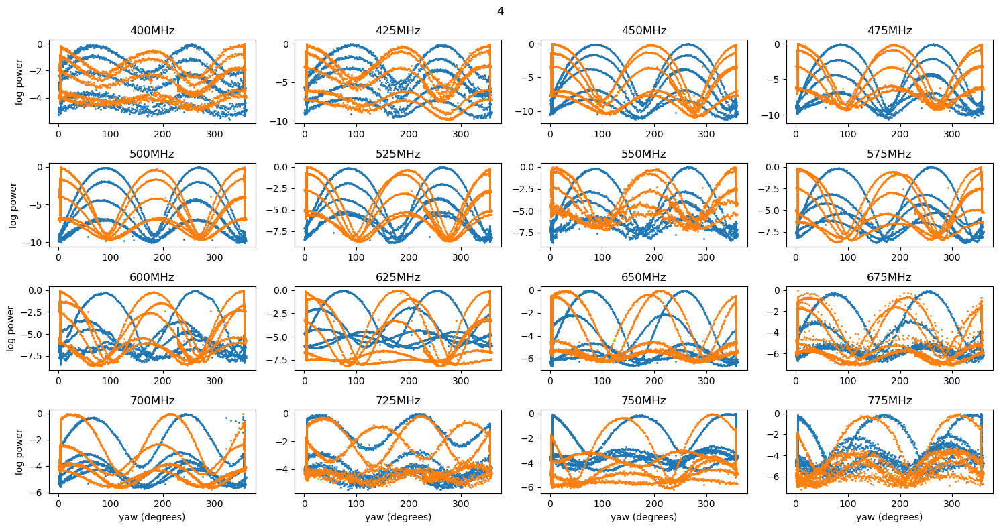

6 7


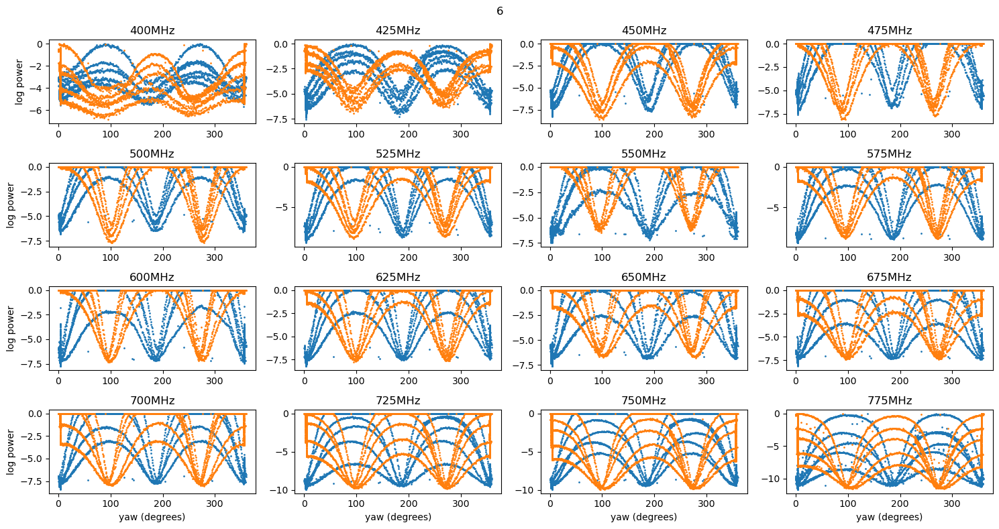

8 9


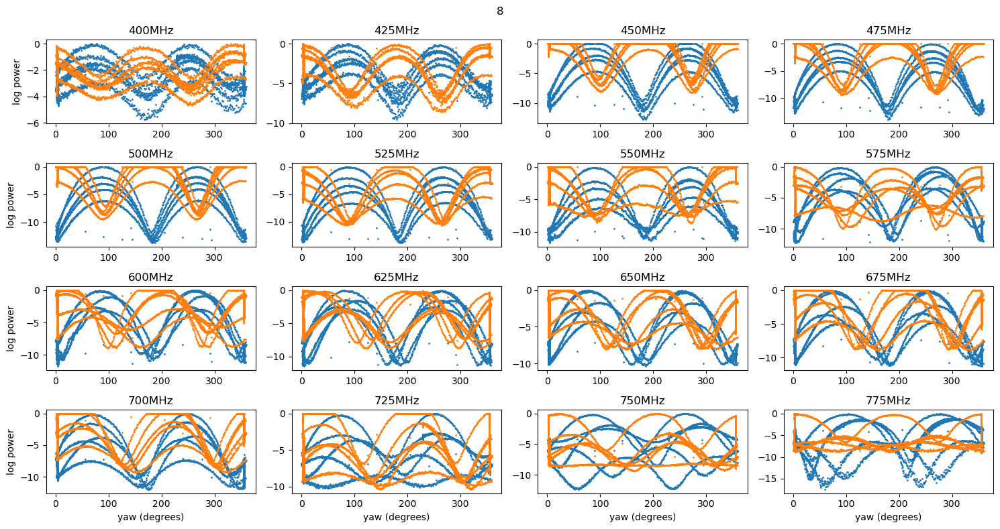

10 11


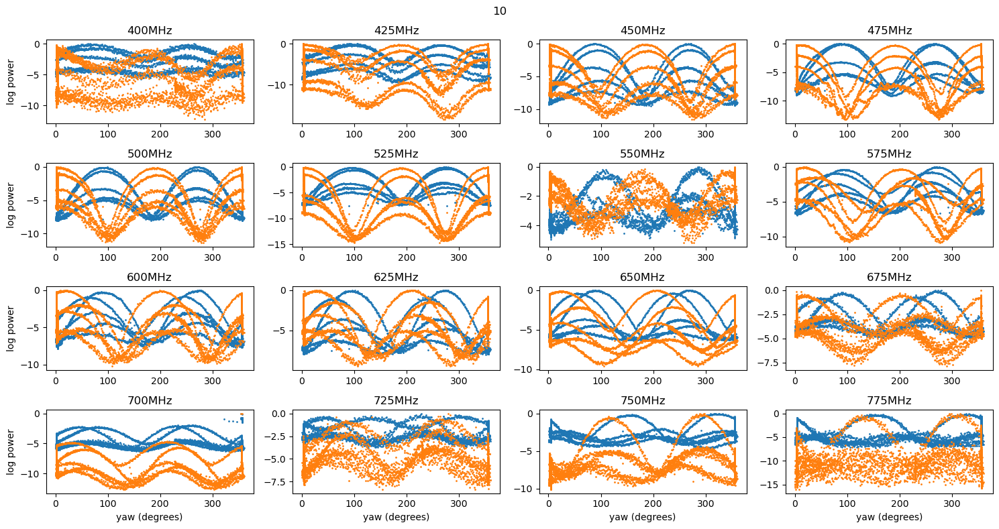

12 13


/home/erk26/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:12: RuntimeWarning: divide by zero encountered in log10
  if sys.path[0] == "":
/home/erk26/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:13: RuntimeWarning: divide by zero encountered in log10
  del sys.path[0]
/home/erk26/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:13: RuntimeWarning: invalid value encountered in subtract
  del sys.path[0]


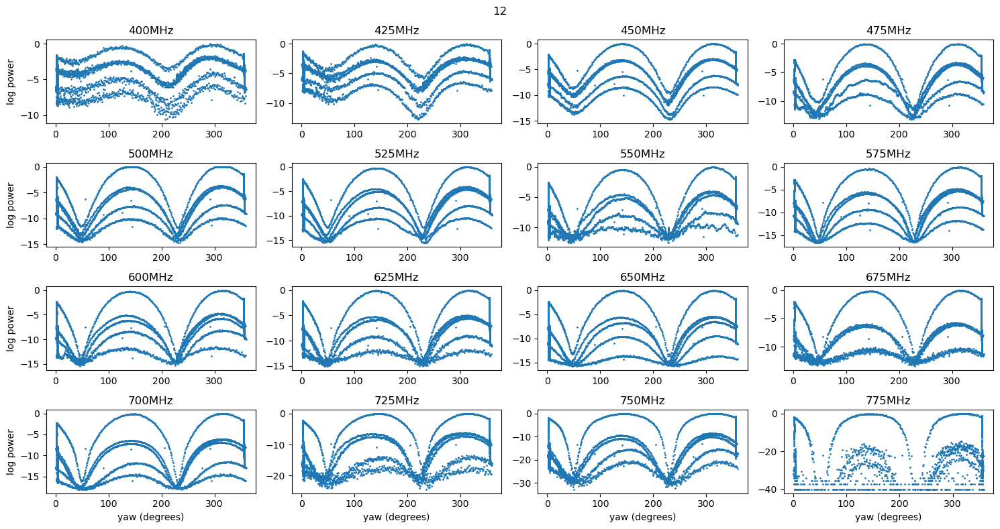

14 15


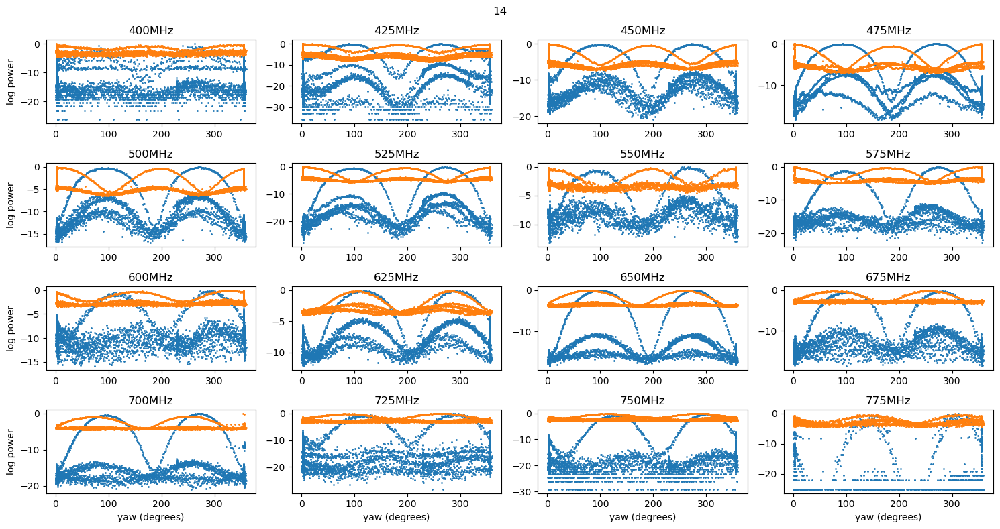

In [42]:
lb = 6600
ub = 11500
offset = 100

for chan in [(a,a+1) for a in np.arange(0,16,2)]:
    print(chan[0],chan[1])
    fig = figure(figsize = (15,8))
    for i, freq1 in enumerate(np.arange(400,800,25)):
        freq = find_indx(test_concat.freq, freq1)
        ax = fig.add_subplot(4,4,i+1)
        for j in np.arange(chan[0],chan[1]+1,1):
            ax.plot(test_concat.drone_yaw_interp[lb+offset:ub+offset], 10*np.log10(test_concat.V[:,freq,j][lb:ub])\
                    -np.max(10*np.log10(test_concat.V[:,freq,j][lb:ub])), '.', markersize = 2)

    #         for k in [(7080, 7420),(8090,8700),(9150,9600),(10050,10550),(10950,11400)]:
    #             ax.plot(test_concat.drone_yaw_interp[offset:][k[0]:k[1]], 10*np.log10(test_concat.V[k[0]:k[1],freq,0])\
    #                     -np.max(10*np.log10(test_concat.V[:,freq,j][lb:ub])), '.', markersize = 2)

        ax.set_title(str(freq1)+'MHz')
        if i%4 == 0: ax.set_ylabel('log power')
        if i in range(12,16): ax.set_xlabel('yaw (degrees)')
    #wtf
    suptitle(chan[0])
    tight_layout()
    show()

[-0.13226254  2.01885818 45.26130214  0.18256199]
[  0.12831857   2.01543493 -40.7149461    0.16745527]
[ 4.64152123e-02  2.04155382e+00 -2.13044792e+02  7.98251226e-02]
[ 0.0272749   2.301197   -8.6601588   0.05436031]
[  0.43614511   2.04752299 -35.75999261   0.5207654 ]


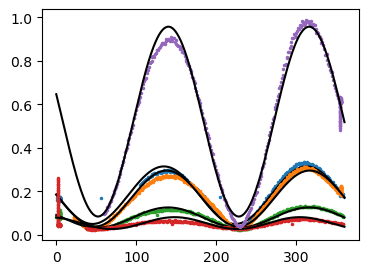

In [43]:
figure(figsize = (9,3))
subplot(1,2, 1)
offset = 100

for i in [(7080, 7420),(8090,8700),(9150,9600),(10050,10550),(10950,11400)]:
    plot(test_concat.drone_yaw_interp[offset:][i[0]:i[1]], 1e7*(test_concat.V[i[0]:i[1],600,12]), '.', markersize = 3)

    popt, pcov = opt.curve_fit(cos_fun, test_concat.drone_yaw_interp[offset:][i[0]:i[1]], \
                           1e7*(test_concat.V[i[0]:i[1],600,12]), p0=[1,2,1,1])
    
    plot(np.linspace(0,360,360), cos_fun(np.linspace(0,360,360), *popt), 'k')
#     axvline(popt[2])
    print(popt)


[-0.50266908  2.07967835 10.67930152  0.63509084]
[-0.49611849  2.02888858  6.95338375  0.64447876]
[-0.27118487  2.06574962 10.30528743  0.3718451 ]
[-0.44120484  2.03831005  7.10256033  0.57950845]
[-0.31989799  2.06246185  8.26009992  0.42387204]


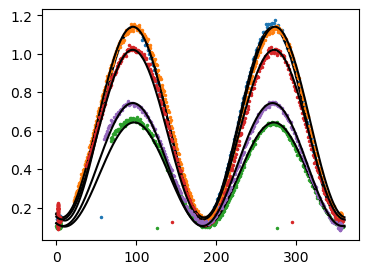

In [44]:
figure(figsize = (9,3))
subplot(1,2, 1)
offset = 100

for i in [(7080, 7420),(8090,8700),(9150,9600),(10050,10550),(10950,11400)]:
    plot(test_concat.drone_yaw_interp[offset:][i[0]:i[1]], 1e7*(test_concat.V[i[0]:i[1],900,0]), '.', markersize = 3)

    popt, pcov = opt.curve_fit(cos_fun, test_concat.drone_yaw_interp[offset:][i[0]:i[1]], \
                           1e7*(test_concat.V[i[0]:i[1],900,0]), p0=[1,2,1,1])
    
    plot(np.linspace(0,360,360), cos_fun(np.linspace(0,360,360), *popt), 'k')
#     axvline(popt[2])
    print(popt)


From Drone Outline:

[ERK] 360 rotation: 

1. Pick one rotation flight 
2. Get mechanism for splitting different passes 
3. Fit sinusoid 
4. Plot parameters as a function of frequency
5. ID rotation flights
6. Repeat process

Fit sine for phase, period. Plot as a function of frequency. Compare fast, slow rotations. Use range of timing offsets from the regular flights to make a statement about likelihood of that causing the offset.
Compare/reproduce/ask Devin for Devin’s analysis with sims
Can we associate this with the drone or dishes (ie everything is common: pol angle and the sidelobe locations are common angles, not, HIRAX vs CHIME, etc). 
GPS vs magnetic north (limit), timing offset.
This is self contained


In [45]:
len(test_concat.freq)

1024

Text(0, 0.5, 'meters')

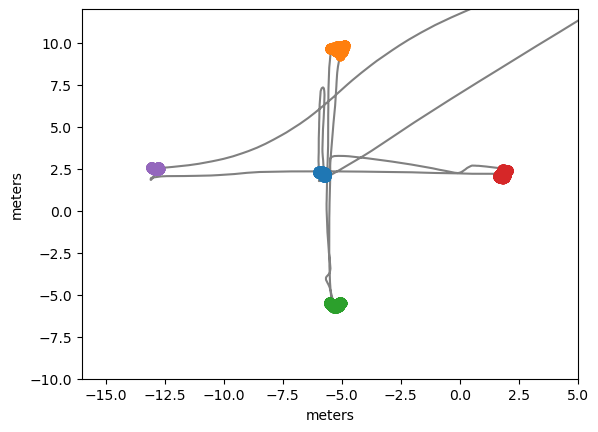

In [46]:
plot(test_concat.drone_xyz_LC_interp[:,0],test_concat.drone_xyz_LC_interp[:,1], color = 'grey')
for i in [(7080, 7420),(8090,8700),(9150,9600),(10050,10550),(10950,11400)]:
    plot(test_concat.drone_xyz_LC_interp[i[0]:i[1],0],test_concat.drone_xyz_LC_interp[i[0]:i[1],1], 'o')
xlim(-16,5)
ylim(-10,12)
xlabel('meters')
ylabel('meters')

In [47]:
fits = np.zeros((5,4,1024))

for findex in range(1024):
    j = 0
    for i in [(7080, 7420),(8090,8700),(9150,9600),(10050,10550),(10950,11400)]:
        popt, pcov = opt.curve_fit(cos_fun, test_concat.drone_yaw_interp[offset:][i[0]:i[1]], \
                               1e7*(test_concat.V[i[0]:i[1],findex,0]), p0=[1,2,1,1])
        fits[j,:,findex] = popt
        j +=1


/home/erk26/anaconda3/lib/python3.7/site-packages/scipy/optimize/minpack.py:834: OptimizeWarning: Covariance of the parameters could not be estimated
  category=OptimizeWarning)


In [48]:
fits_chime = np.zeros((2,5,8,1024))

for findex in range(1024):
    j = 0
    for i in [(7080, 7420),(8090,8700),(9150,9600),(10050,10550),(10950,11400)]:
        chan = 6
        
        popt, pcov = opt.curve_fit(cos_fun, test_concat.drone_yaw_interp[offset:][i[0]:i[1]], \
                           1e7*(test_concat.V[i[0]:i[1],findex,chan]), p0=[1,2,1,1])
        fits_chime[0,j,0:4,findex] = popt
        fits_chime[0,j,4:8,findex] = [pcov[i,i] for i in range(len(pcov))]
        
        chan = 7

        popt, pcov = opt.curve_fit(cos_fun, test_concat.drone_yaw_interp[offset:][i[0]:i[1]], \
                           1e7*(test_concat.V[i[0]:i[1],findex,chan]), p0=[1,2,1,1])

        fits_chime[1,j,0:4,findex] = popt
        fits_chime[1,j,4:8,findex] = [pcov[i,i] for i in range(len(pcov))]

        j +=1


In [49]:
fits_hirax = np.zeros((2,5,8,1024))

for findex in range(1024):
    j = 0
    for i in [(7080, 7420),(8090,8700),(9150,9600),(10050,10550),(10950,11400)]:
        chan = 0
        popt, pcov = opt.curve_fit(cos_fun, test_concat.drone_yaw_interp[offset:][i[0]:i[1]], \
                               1e7*(test_concat.V[i[0]:i[1],findex,chan]), p0=[1,2,1,1])
        
        fits_hirax[0,j,0:4,findex] = popt
        fits_hirax[0,j,4:8,findex] = [pcov[i,i] for i in range(len(pcov))]
        
        chan = 1

        popt, pcov = opt.curve_fit(cos_fun, test_concat.drone_yaw_interp[offset:][i[0]:i[1]], \
                        1e7*(test_concat.V[i[0]:i[1],findex,chan]), p0=[1,2,1,1])
        
        fits_hirax[1,j,0:4,findex] = popt
        fits_hirax[1,j,4:8,findex] = [pcov[i,i] for i in range(len(pcov))]
        j +=1


In [50]:
fits2 = np.zeros((5,8,1024))

for findex in range(1024):
    j = 0
    for i in [(7080, 7420),(8090,8700),(9150,9600),(10050,10550),(10950,11400)]:
        popt, pcov = opt.curve_fit(cos_fun, test_concat.drone_yaw_interp[offset:][i[0]:i[1]], \
                               1e7*(test_concat.V[i[0]:i[1],findex,0]), p0=[1,2,1,1])
#         residuals = (1e7*(test_concat.V[i[0]:i[1],findex,0])-cos_fun(test_concat.drone_yaw_interp[offset:][i[0]:i[1]], *popt))
        
        fits2[j,0:4,findex] = popt
        fits2[j,4:8,findex] = [pcov[i,i] for i in range(len(pcov))]
#         fits2[j,4,findex] = residuals_perc
        j +=1


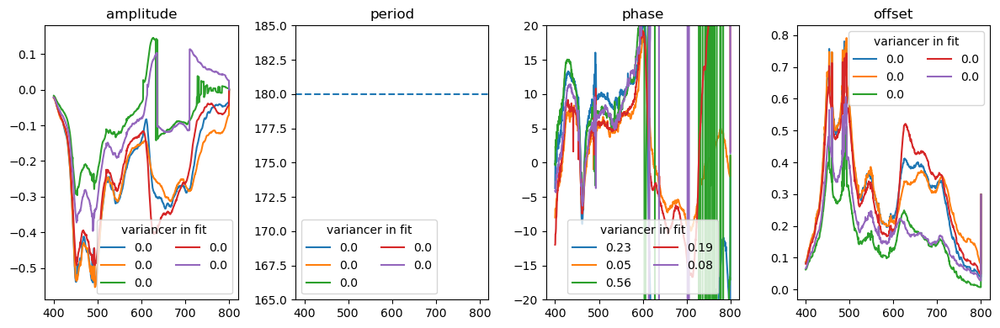

In [51]:
titles = ['amplitude', 'period', 'phase', 'offset']

figure(figsize = (12,4))
for j in range(4):
    subplot(1,4,j+1)
    for i in range(5):
        plot(np.linspace(800,400,1024), fits2[i,j,:], label = round(np.median(fits2[i,j+4,:]),2))
    title(titles[j])
    if j == 1: 
        ylim(165,185)
        axhline(180, linestyle = '--')
    if j == 2: ylim(-20,20)
    legend(title = 'variancer in fit', ncol = 2)
tight_layout()

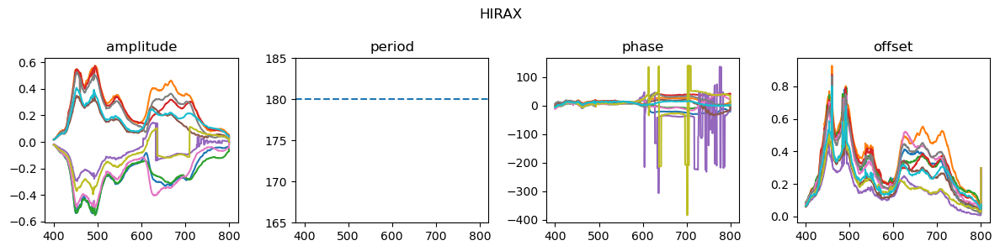

In [52]:
titles = ['amplitude', 'period', 'phase', 'offset']

figure(figsize = (12,3))
for j in range(4):
    subplot(1,4,j+1)
    for i in range(5):
        plot(np.linspace(800,400,1024), fits_hirax[0,i,j,:], label = round(np.median(fits_hirax[0,i,j+4,:]),2))
        plot(np.linspace(800,400,1024), fits_hirax[1,i,j,:], label = round(np.median(fits_hirax[1,i,j+4,:]),2))
    title(titles[j])
    if j == 1: 
        ylim(165,185)
        axhline(180, linestyle = '--')
#     if j == 2: ylim(-20,20)
#     legend(title = 'variancer in fit', ncol = 2)

suptitle('HIRAX')
tight_layout()

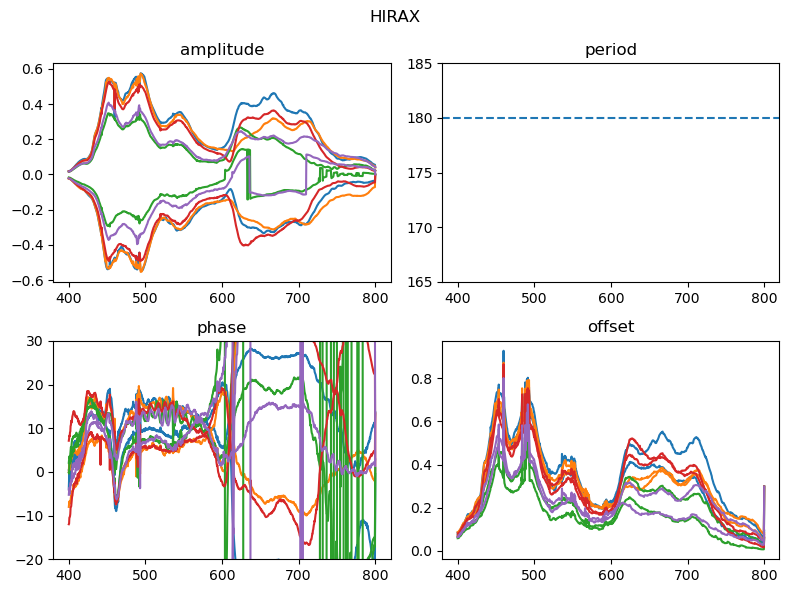

In [53]:
titles = ['amplitude', 'period', 'phase', 'offset']

figure(figsize = (8,6))
for j in range(4):
    subplot(2,2,j+1)
    col = ['C0', 'C1', 'C2','C3','C4']
    for i in range(5):
        plot(np.linspace(800,400,1024), fits_hirax[0,i,j,:], color = col[i])
        plot(np.linspace(800,400,1024), fits_hirax[1,i,j,:],  color = col[i])
    title(titles[j])
    if j == 1: 
        ylim(165,185)
        axhline(180, linestyle = '--')
    if j == 2: ylim(-20,30)
#     legend(title = 'variancer in fit', ncol = 2)

suptitle('HIRAX')
tight_layout()

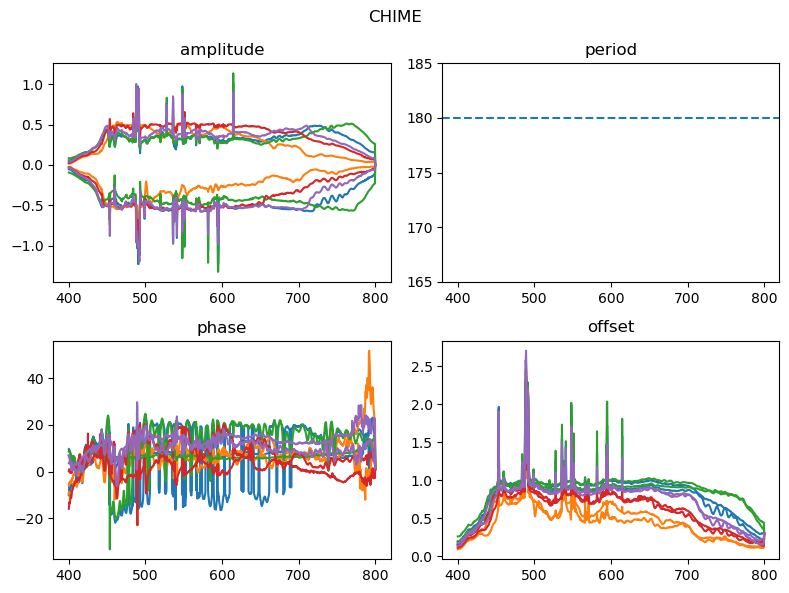

In [54]:
titles = ['amplitude', 'period', 'phase', 'offset']

figure(figsize = (8,6))
for j in range(4):
    subplot(2,2,j+1)
    col = ['C0', 'C1', 'C2','C3','C4']
    for i in range(5):
        plot(np.linspace(800,400,1024), fits_chime[0,i,j,:], color = col[i])
        plot(np.linspace(800,400,1024), fits_chime[1,i,j,:],  color = col[i])
    title(titles[j])
    if j == 1: 
        ylim(165,185)
        axhline(180, linestyle = '--')
#     if j == 2: ylim(-20,20)
#     legend(title = 'variancer in fit', ncol = 2)

suptitle('CHIME')
tight_layout()

we should see two phase lines. lol 
actually, split amplitudes is fine

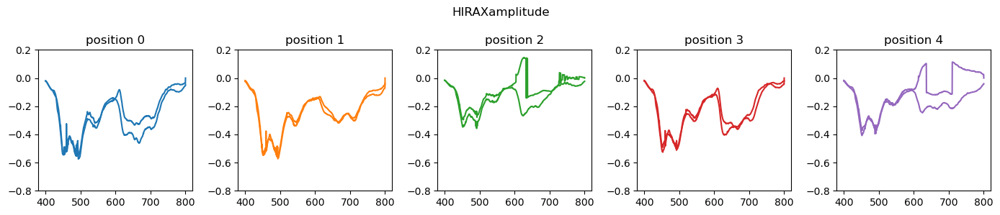

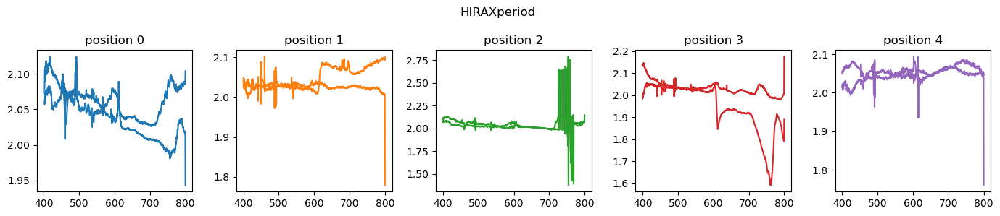

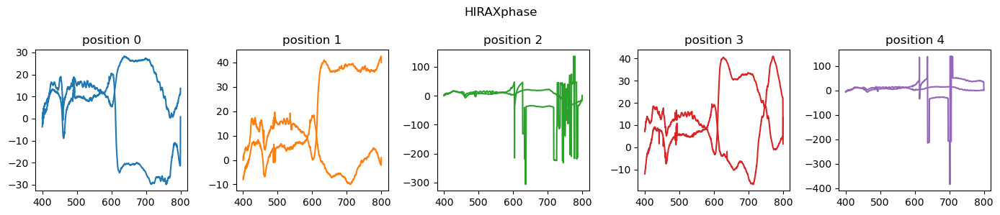

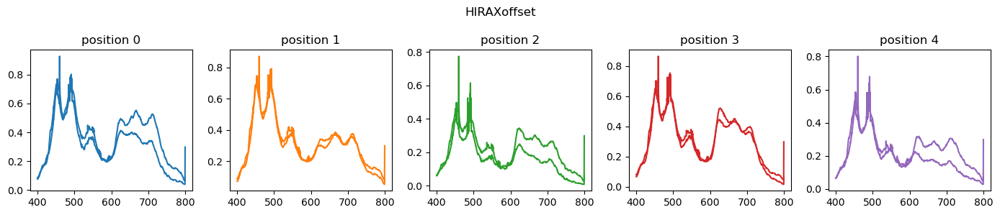

In [55]:
# plot amplitude for pol on each dish
# plot period ... 
for j in range(4):    
    figure(figsize = (14,3))
    col = ['C0', 'C1', 'C2','C3','C4']
    for i in range(5):
        subplot(1,5,i+1)
        plot(np.linspace(800,400,1024), fits_hirax[0,i,j,:], color = col[i])
        if j ==0: 
            plot(np.linspace(800,400,1024), -1*fits_hirax[1,i,j,:],  color = col[i])
            ylim(-0.8,0.2)
        else: 
            plot(np.linspace(800,400,1024), fits_hirax[1,i,j,:],  color = col[i])

        title('position '+str(i))
    suptitle('HIRAX'+ titles [j])
    tight_layout()
    show()


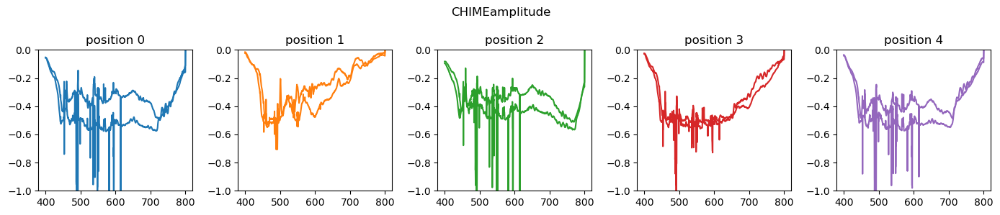

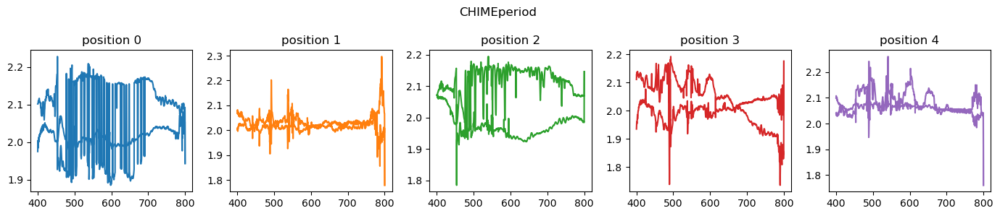

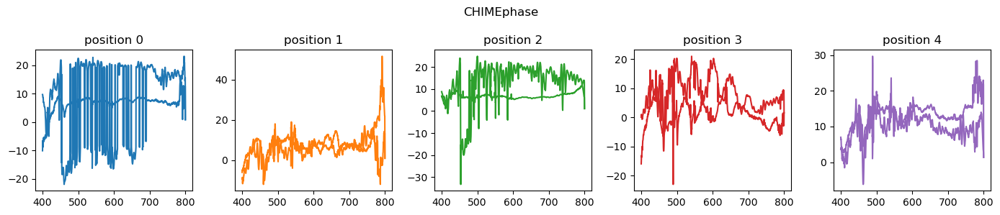

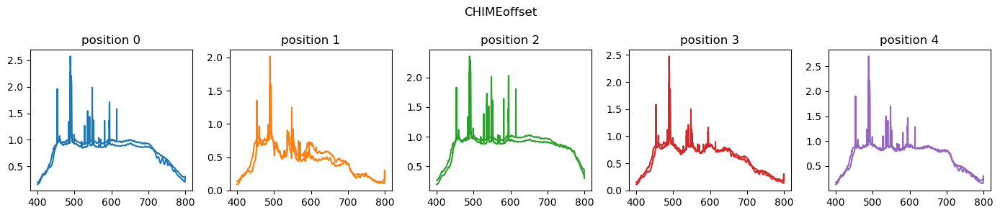

In [56]:
# plot amplitude for pol on each dish
# plot period ... 
for j in range(4):    
    figure(figsize = (14,3))
    col = ['C0', 'C1', 'C2','C3','C4']
    for i in range(5):
        subplot(1,5,i+1)
        plot(np.linspace(800,400,1024), fits_chime[0,i,j,:], color = col[i])
        if j ==0: 
            plot(np.linspace(800,400,1024), -1*fits_chime[1,i,j,:],  color = col[i])
            ylim(-1,0)
        else: 
            plot(np.linspace(800,400,1024), fits_chime[1,i,j,:],  color = col[i])

        title('position '+str(i))
    suptitle('CHIME'+ titles [j])
    tight_layout()
    show()


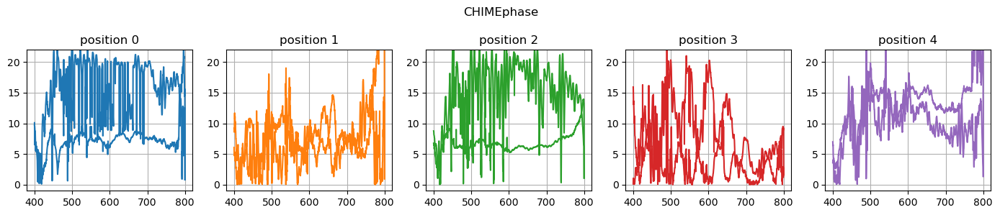

In [57]:
# plot phase for individual locations for both hirax and chime

figure(figsize = (14,3))
j=2
col = ['C0', 'C1', 'C2','C3','C4']
for i in range(5):
    subplot(1,5,i+1)
    plot(np.linspace(800,400,1024), np.abs(fits_chime[0,i,j,:]), color = col[i])
    plot(np.linspace(800,400,1024), np.abs(fits_chime[1,i,j,:]),  color = col[i])
    grid()
    title('position '+str(i))
    ylim(-1,22)
suptitle('CHIME'+ titles [j])
tight_layout()


In [58]:
fits_hirax[:,:,1,:] = 360/fits_hirax[:,:,1,:]
fits_chime[:,:,1,:] = 360/fits_chime[:,:,1,:]

In [59]:
# figure(figsize = (8,2))
# subplot(1,2,1)
# plot(1e7*(test_concat.V[i[0]:i[1],findex,0]))
# plot(cos_fun(test_concat.drone_yaw_interp[offset:][i[0]:i[1]], *popt))

# subplot(1,2,2)
# plot(100*residuals_perc)


In [60]:
fits2[i,j+4,:]

array([       inf, 0.06400191, 0.0663283 , ..., 1.37955409, 1.34410099,
       1.52091142])

In [61]:
fits2[:,1,:] = 360/fits2[:,1,:]

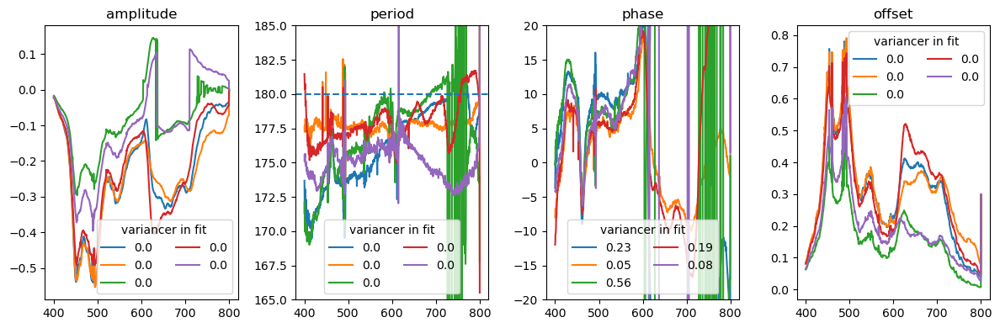

In [62]:
titles = ['amplitude', 'period', 'phase', 'offset']
figure(figsize = (12,4))
for j in range(4):
    subplot(1,4,j+1)
    for i in range(5):
        plot(np.linspace(800,400,1024), fits2[i,j,:], label = round(np.median(fits2[i,j+4,:]),2))
    title(titles[j])
    if j == 1: 
        ylim(165,185)
        axhline(180, linestyle = '--')
    if j == 2: ylim(-20,20)
    legend(title = 'variancer in fit', ncol = 2)
tight_layout()

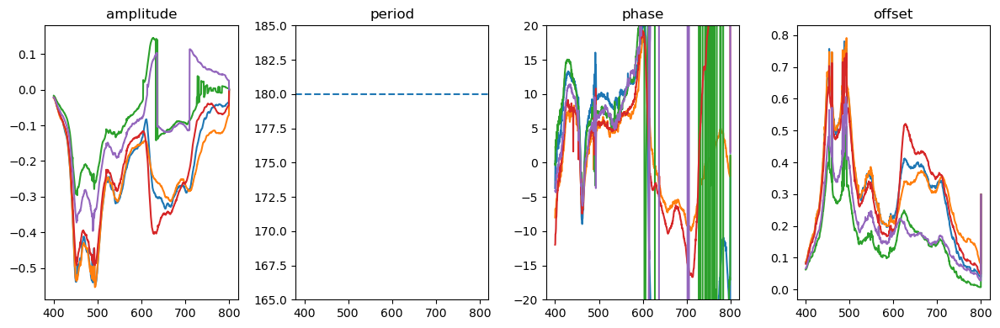

In [63]:
#amplitude
titles = ['amplitude', 'period', 'phase', 'offset']
figure(figsize = (12,4))
for j in range(4):
    subplot(1,4,j+1)
    for i in range(5):
        plot(np.linspace(800,400,1024), fits[i,j,:])
    title(titles[j])
    if j == 1: 
        ylim(165,185)
        axhline(180, linestyle = '--')
    if j == 2: ylim(-20,20)
tight_layout()

In [64]:
# seems odd that the period is always a bit less than 180 degrees .. what does this say about yaw? maybe is issue with my timing correction? 


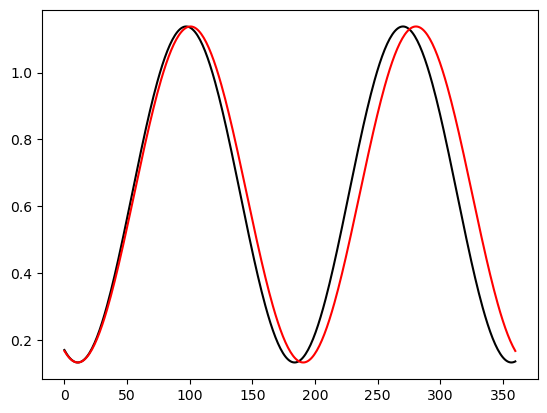

In [65]:
plot(np.linspace(0,360,360), cos_fun(np.linspace(0,360,360), *fits[0,:,900]), 'k')
plot(np.linspace(0,360,360), cos_fun(np.linspace(0,360,360), *[ -0.50266908, 2,  10.67930152,   0.63509084]), 'r')


In [66]:
fits[0,:,900]

array([-0.50266908,  2.07967835, 10.67930152,  0.63509084])

In [67]:
# get fits for everything, plot

In [68]:
fits_all = np.zeros((16,5,8,1024))

for findex in range(1024):
    j = 0
    for i in [(7080, 7420),(8090,8700),(9150,9600),(10050,10550),(10950,11400)]:
        
        for chan in np.arange(0,16,1):
            try:
                popt, pcov = opt.curve_fit(cos_fun, test_concat.drone_yaw_interp[offset:][i[0]:i[1]], \
                                   1e7*(test_concat.V[i[0]:i[1],findex,chan]), p0=[1,2,1,1])

                fits_all[chan,j,0:4,findex] = popt
                fits_all[chan,j,4:8,findex] = [pcov[i,i] for i in range(len(pcov))]
            except: pass
    
        j +=1


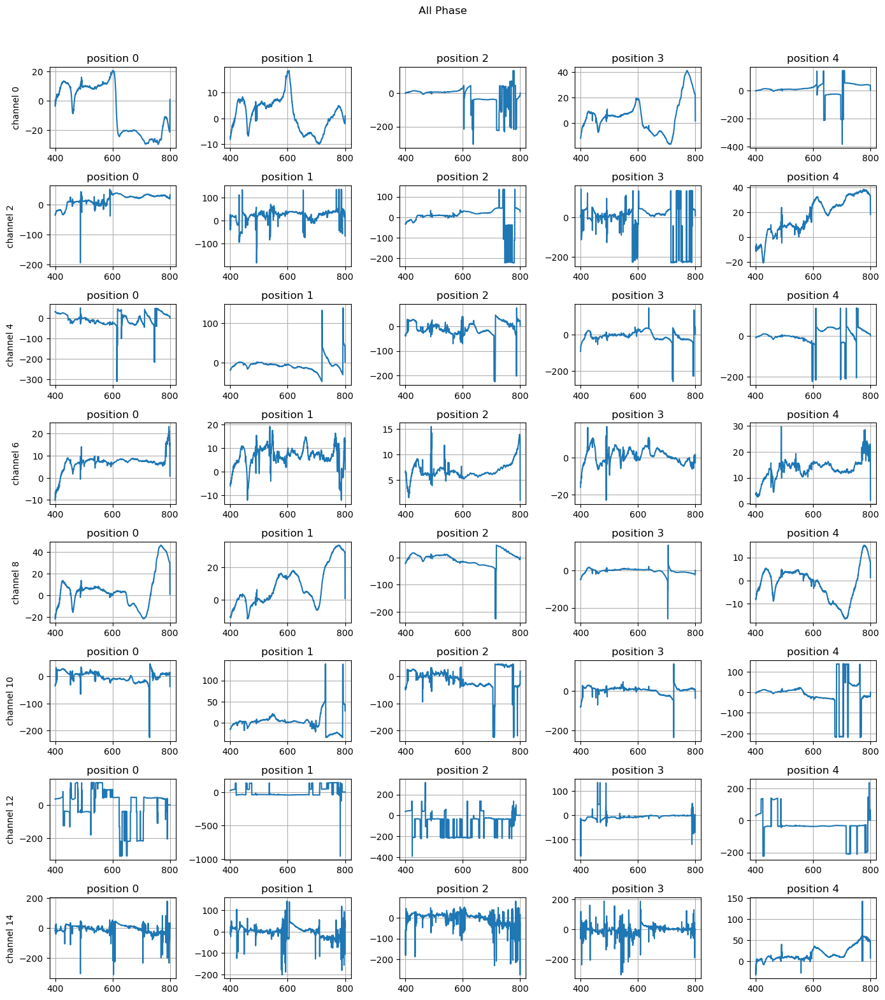

In [69]:
# plot phase for individual locations for both hirax and chime

figure(figsize = (14,30))
j=2
col = ['C0', 'C1', 'C2','C3','C4']
for k in np.arange(0,16,2):
    for i in range(5):
        subplot(16,5,(int(k/2))*5+i+1)
        plot(np.linspace(800,400,1024), fits_all[k,i,j,:])
        grid()
        title('position '+str(i))
        if i == 0: ylabel('channel '+str(k))
suptitle('All Phase', y=1.01)
tight_layout()


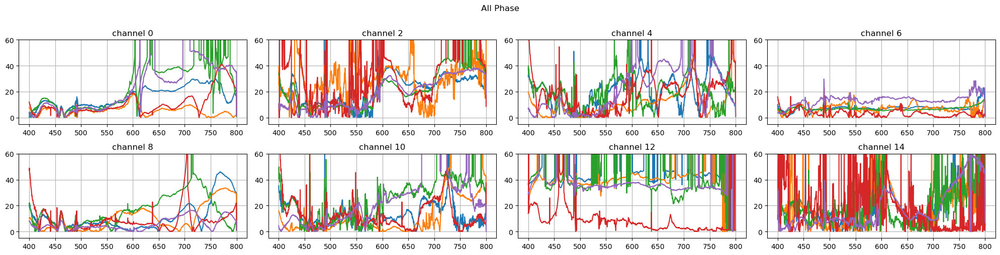

In [70]:
# plot phase for individual locations for both hirax and chime

figure(figsize = (20,5))
j=2
col = ['C0', 'C1', 'C2','C3','C4']
for k in np.arange(0,16,2):
    subplot(2,4,(int(k/2))+1)
    for i in range(5):
        plot(np.linspace(800,400,1024), np.abs(fits_all[k,i,j,:]))
        grid()
        ylim(-5,60)
    title('channel '+str(k))
suptitle('All Phase', y=1.01)
tight_layout()
show()


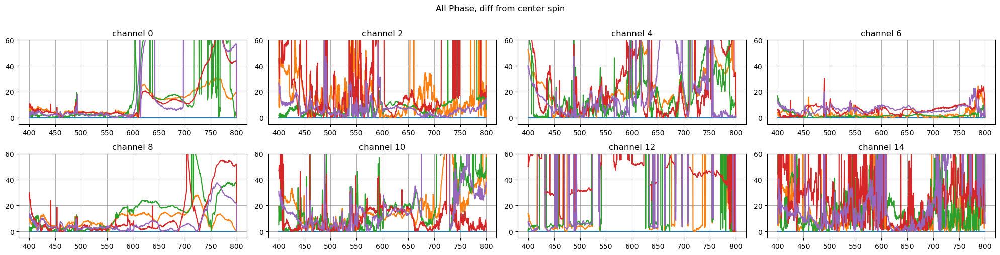

In [71]:
# show diff from first position
figure(figsize = (20,5))
j=2
col = ['C0', 'C1', 'C2','C3','C4']
for k in np.arange(0,16,2):
    subplot(2,4,(int(k/2))+1)
    for i in range(5):
        plot(np.linspace(800,400,1024), np.abs(fits_all[k,0,j,:]-fits_all[k,i,j,:]))
        grid()
        ylim(-5,60)
    title('channel '+str(k))
suptitle('All Phase, diff from center spin', y=1.01)
tight_layout()
show()

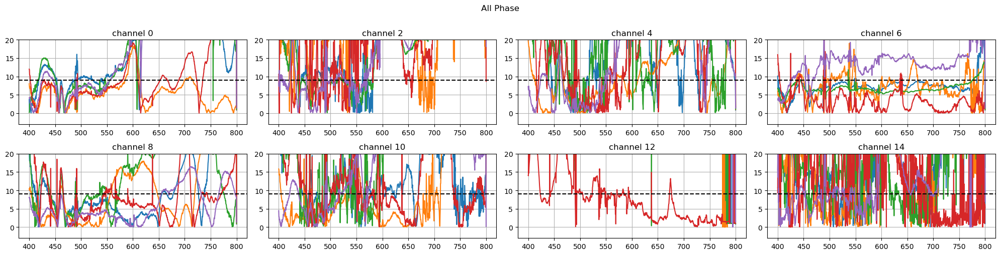

In [72]:
# with restricted range
figure(figsize = (20,5))
j=2
col = ['C0', 'C1', 'C2','C3','C4']
for k in np.arange(0,16,2):
    subplot(2,4,(int(k/2))+1)
    for i in range(5):
        plot(np.linspace(800,400,1024), np.abs(fits_all[k,i,j,:]))
        grid()
        ylim(-3,20)
    title('channel '+str(k))
    axhline(9, color = 'k', linestyle = '--')
suptitle('All Phase', y=1.01)
tight_layout()
show()

0 1


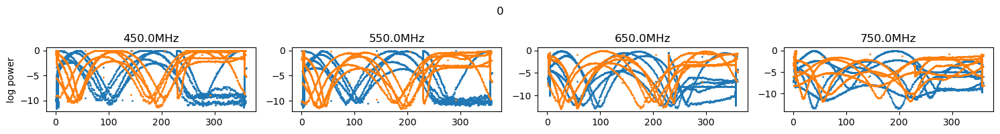

0 1


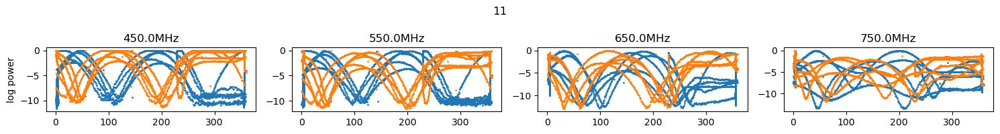

0 1


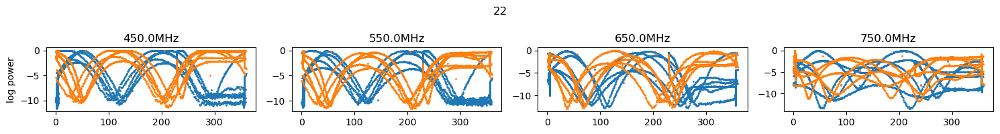

0 1


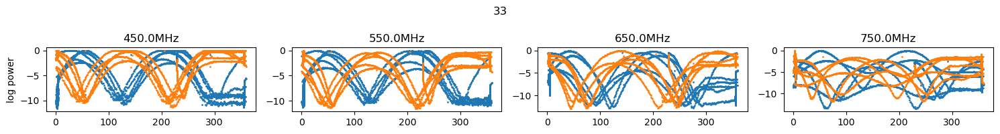

0 1


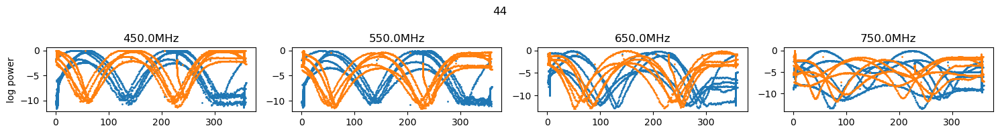

0 1


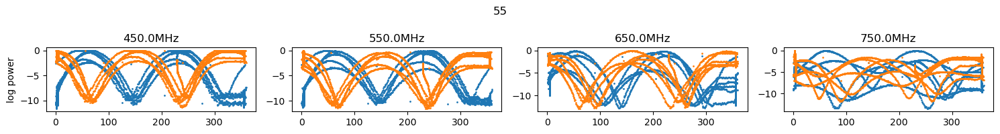

0 1


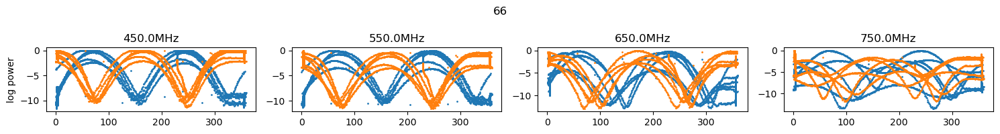

0 1


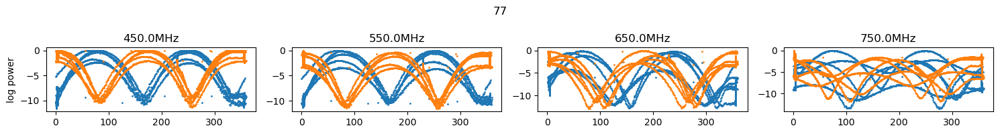

0 1


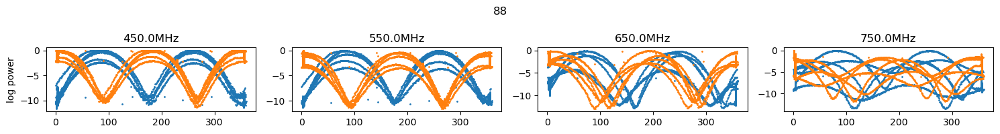

0 1


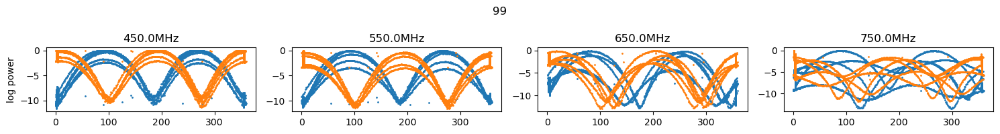

0 1


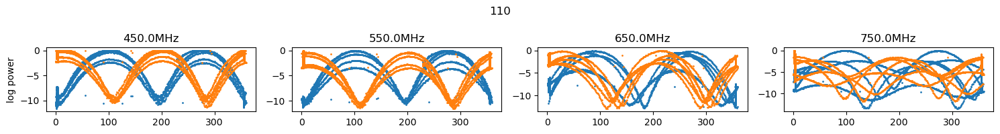

0 1


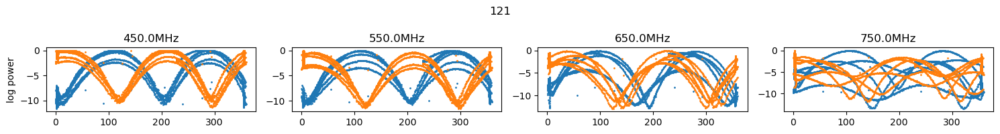

0 1


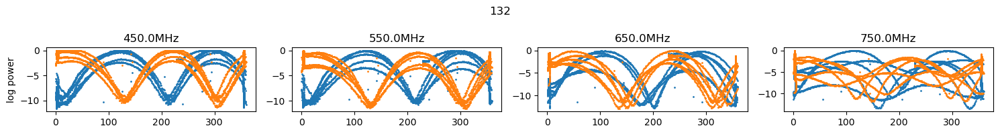

0 1


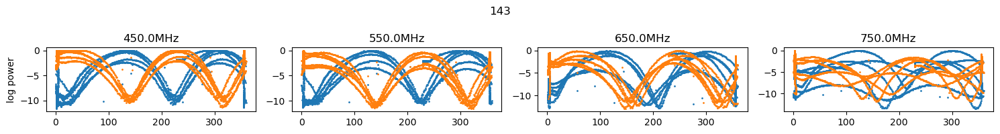

0 1


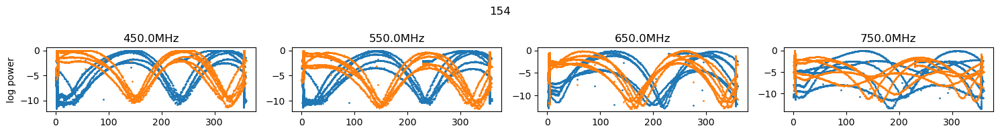

0 1


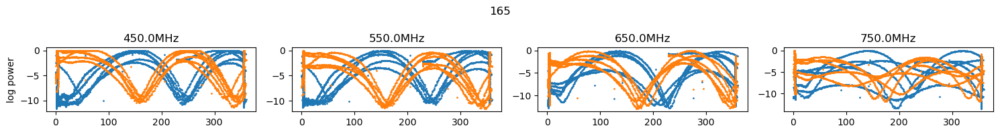

0 1


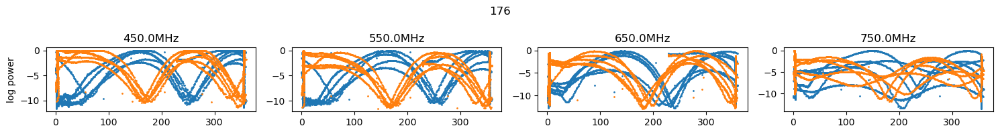

0 1


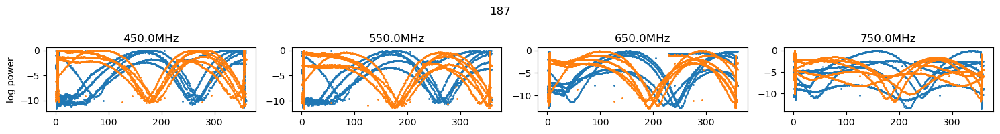

0 1


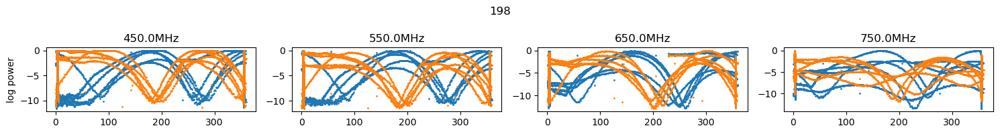

In [73]:
lb = 6600
ub = 11500
offset = 100
for offset in np.arange(0,200,11):
    for chan in [(a,a+1) for a in np.arange(0,2,2)]:
        print(chan[0],chan[1])
        fig = figure(figsize = (15,2))
        for i, freq1 in enumerate(np.linspace(450,750,4)):
            freq = find_indx(test_concat.freq, freq1)
            ax = fig.add_subplot(1,4,i+1)
            for j in np.arange(chan[0],chan[1]+1,1):
                ax.plot(test_concat.drone_yaw_interp[lb+offset:ub+offset], 10*np.log10(test_concat.V[:,freq,j][lb:ub])\
                        -np.max(10*np.log10(test_concat.V[:,freq,j][lb:ub])), '.', markersize = 2)

        #         for k in [(7080, 7420),(8090,8700),(9150,9600),(10050,10550),(10950,11400)]:
        #             ax.plot(test_concat.drone_yaw_interp[offset:][k[0]:k[1]], 10*np.log10(test_concat.V[k[0]:k[1],freq,0])\
        #                     -np.max(10*np.log10(test_concat.V[:,freq,j][lb:ub])), '.', markersize = 2)

            ax.set_title(str(freq1)+'MHz')
            if i%4 == 0: ax.set_ylabel('log power')
            if i in range(12,16): ax.set_xlabel('yaw (degrees)')
        #wtf
        suptitle(offset)
        tight_layout()
        show()

In [74]:
np.linspace(0,200,11)

array([  0.,  20.,  40.,  60.,  80., 100., 120., 140., 160., 180., 200.])

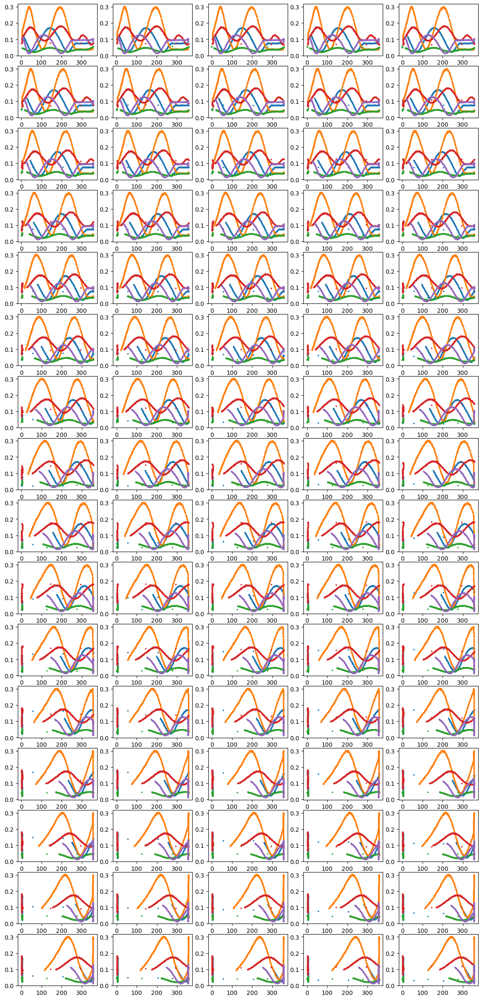

In [75]:
figure(figsize = (14,30))
subplot(1,2, 1)
offset = 100
for i, offset in enumerate(np.linspace(0,300,80, dtype = 'int')):
    subplot(16,5,i+1)
    for i in [(7080, 7420),(8090,8700),(9150,9600),(10050,10550),(10950,11400)]:
        plot(test_concat.drone_yaw_interp[offset:][i[0]:i[1]], 1e7*(test_concat.V[i[0]:i[1],128,0]), '.', markersize = 3)


In [76]:
test_concat.drone_xyz_LC_interp.shape

(15360, 3)

In [78]:
# test_concat.V.sa

[-0.27118487  2.06574962 10.30528743  0.3718451 ]
[  0.30379395   2.03117492 189.30668807   0.40956315]


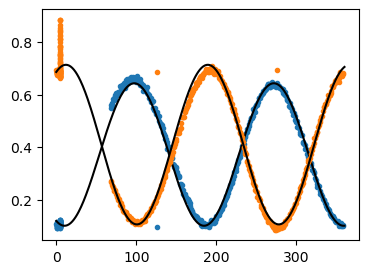

In [79]:
# try to fit both pols one pass, capture phase offset

figure(figsize = (9,3))
subplot(1,2, 1)
offset = 100

# for i in [(7080, 7420),(8090,8700),(9150,9600),(10050,10550),(10950,11400)]:
for i in [(9150,9600)]:
    plot(test_concat.drone_yaw_interp[offset:][i[0]:i[1]], 1e7*(test_concat.V[i[0]:i[1],900,0]), 'o', markersize = 3)

    popt, pcov = opt.curve_fit(cos_fun, test_concat.drone_yaw_interp[offset:][i[0]:i[1]], \
                           1e7*(test_concat.V[i[0]:i[1],900,0]), p0=[1,2,1,1])
    
    plot(np.linspace(0,360,360), cos_fun(np.linspace(0,360,360), *popt), 'k')
    
    
    
    print(popt)

    
    plot(test_concat.drone_yaw_interp[offset:][i[0]:i[1]], 1e7*(test_concat.V[i[0]:i[1],900,1]), 'o', markersize = 3)

    popt, pcov = opt.curve_fit(cos_fun, test_concat.drone_yaw_interp[offset:][i[0]:i[1]], \
                           1e7*(test_concat.V[i[0]:i[1],900,1]), p0=[1,2,180,1])
    
    plot(np.linspace(0,360,360), cos_fun(np.linspace(0,360,360), *popt), 'k')
    
#     axvline(popt[2])
    print(popt)


In [80]:
2%2

0

In [81]:
fits_all2 = np.zeros((16,5,8,1024))

for findex in range(1024):
    j = 0
    for i in [(7080, 7420),(8090,8700),(9150,9600),(10050,10550),(10950,11400)]:
        
        for chan in np.arange(0,16,1):
            try:
                if chan%2 == 0:
                    popt, pcov = opt.curve_fit(cos_fun, test_concat.drone_yaw_interp[offset:][i[0]:i[1]], \
                                   1e7*(test_concat.V[i[0]:i[1],findex,chan]), p0=[1,2,1,1])
                else:
                    popt, pcov = opt.curve_fit(cos_fun, test_concat.drone_yaw_interp[offset:][i[0]:i[1]], \
                                   1e7*(test_concat.V[i[0]:i[1],findex,chan]), p0=[1,2,180,1])
                
                fits_all2[chan,j,0:4,findex] = popt
                fits_all2[chan,j,4:8,findex] = [pcov[i,i] for i in range(len(pcov))]
            except: pass
    
        j +=1


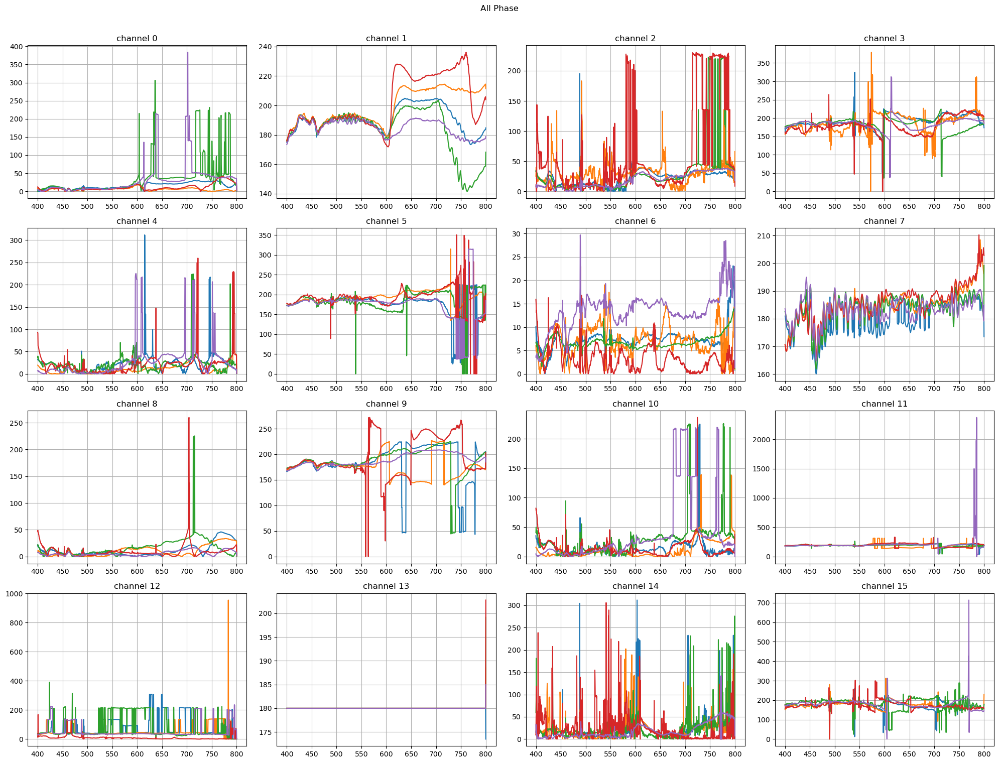

In [82]:
# plot phase for individual locations for both hirax and chime

figure(figsize = (20,15))
j=2
col = ['C0', 'C1', 'C2','C3','C4']
for k in np.arange(0,16,1):
    subplot(4,4,k+1)
    for i in range(5):
        plot(np.linspace(800,400,1024), np.abs(fits_all2[k,i,j,:]))
        grid()
#         ylim(-5,60)
    title('channel '+str(k))
suptitle('All Phase', y=1.01)
tight_layout()
show()


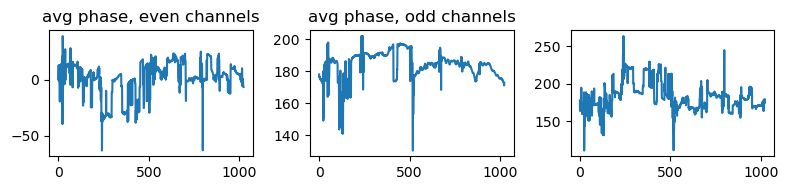

In [83]:
i = 0 # position
j=2 # phase

evens = np.mean([fits_all2[chan,i,j,:] for chan in np.arange(0,16,2)], axis = 0)
odds = np.mean([fits_all2[chan,i,j,:] for chan in np.arange(1,16,2)], axis = 0)

figure(figsize = (8,2))
subplot(1,3,1)
plot(evens)
title('avg phase, even channels')
subplot(1,3,2)
plot(odds)
title('avg phase, odd channels')

subplot(1,3,3)
plot(odds - evens)

tight_layout()

# but we don't want to average bc it incliudes chimes tructure too

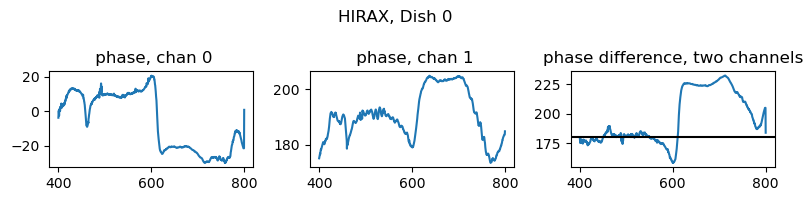

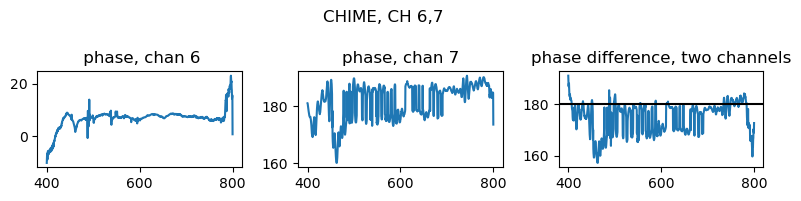

In [84]:
i = 0 # position
j=2 # phase

evens = np.mean([fits_all2[0,i,j,:] for chan in np.arange(0,16,2)], axis = 0)
odds = np.mean([fits_all2[1,i,j,:] for chan in np.arange(1,16,2)], axis = 0)

figure(figsize = (8,2))
subplot(1,3,1)
plot(np.linspace(800,400,1024), evens)
title(' phase, chan 0')
subplot(1,3,2)
plot(np.linspace(800,400,1024), odds)
title(' phase, chan 1')

subplot(1,3,3)
plot(np.linspace(800,400,1024), odds - evens)
axhline(180, color = 'k')
title('phase difference, two channels')
suptitle('HIRAX, Dish 0')
tight_layout()
show()


i = 0 # position
j=2 # phase

evens = np.mean([fits_all2[6,i,j,:] for chan in np.arange(0,16,2)], axis = 0)
odds = np.mean([fits_all2[7,i,j,:] for chan in np.arange(1,16,2)], axis = 0)

figure(figsize = (8,2))
subplot(1,3,1)
plot(np.linspace(800,400,1024), evens)
title(' phase, chan 6')
subplot(1,3,2)
plot(np.linspace(800,400,1024), odds)
title('phase, chan 7')

subplot(1,3,3)
plot(np.linspace(800,400,1024), odds - evens)
axhline(180, color = 'k')
title('phase difference, two channels')
suptitle('CHIME, CH 6,7')
tight_layout()

# but we don't want to average bc it incliudes chimes tructure too

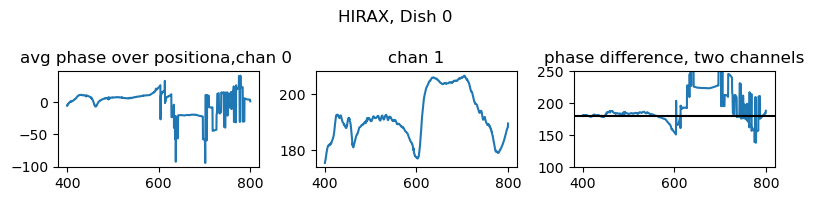

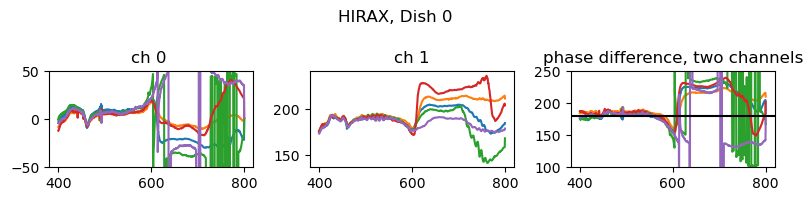

In [85]:
# now averaging over position

i = 0 # position
j=2 # phase

evens = np.mean([fits_all2[0,i,j,:] for i in range(5)], axis = 0)
odds = np.mean([fits_all2[1,i,j,:] for i in range(5)], axis = 0)

figure(figsize = (8,2))
subplot(1,3,1)
plot(np.linspace(800,400,1024), evens)
title('avg phase over positiona,chan 0 ')
subplot(1,3,2)
plot(np.linspace(800,400,1024), odds)
title('chan 1')

subplot(1,3,3)
plot(np.linspace(800,400,1024), odds - evens)
axhline(180, color = 'k')
title('phase difference, two channels')
suptitle('HIRAX, Dish 0')
ylim(100,250)

tight_layout()
show()


i = 0 # position
j=2 # phase


figure(figsize = (8,2))
subplot(1,3,1)
for i in range(5): 
    evens = fits_all2[0,i,j,:]
    plot(np.linspace(800,400,1024), evens)
title('ch 0 ')
ylim(-50,50)

subplot(1,3,2)
for i in range(5): 
    odds = fits_all2[1,i,j,:]
    plot(np.linspace(800,400,1024), odds)
title('ch 1')

subplot(1,3,3)
for i in range(5): 
    evens = fits_all2[0,i,j,:]
    odds = fits_all2[1,i,j,:]    
    plot(np.linspace(800,400,1024), odds - evens)
axhline(180, color = 'k')
ylim(100,250)

title('phase difference, two channels')
suptitle('HIRAX, Dish 0')
tight_layout()
show()


from slack: 


co-added co-pol maps will be available here, starting now: /hirax/GBO_Analysis_Outputs/beam_pickles





7:27
each pickle is a particular frequency, a particular polarization, given by the filename (eg: /hirax/GBO_Analysis_Outputs/beam_pickles/Beamcoadd_pol_E_freq_553.pkl).
7:27
@Emily
 in particular
 
 

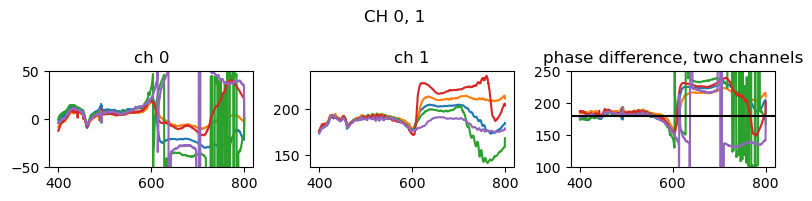

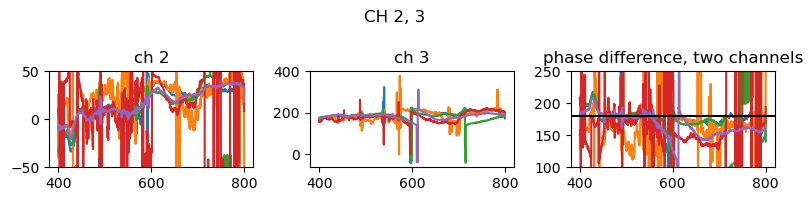

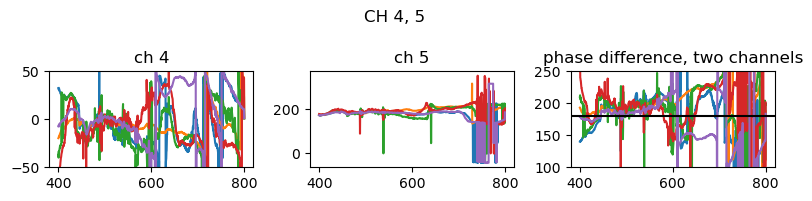

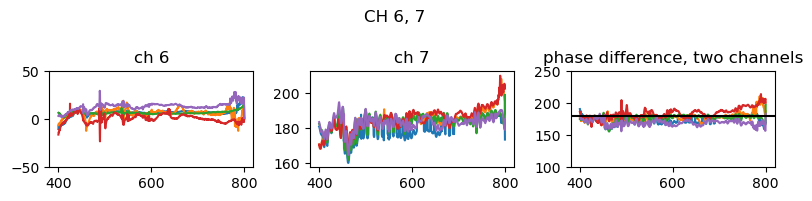

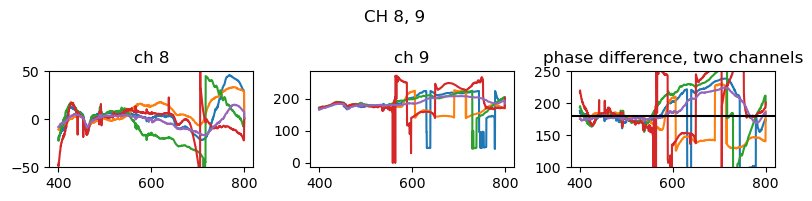

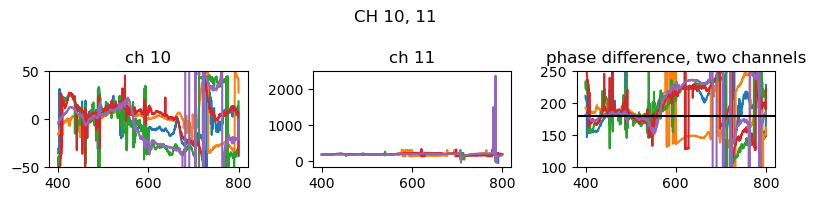

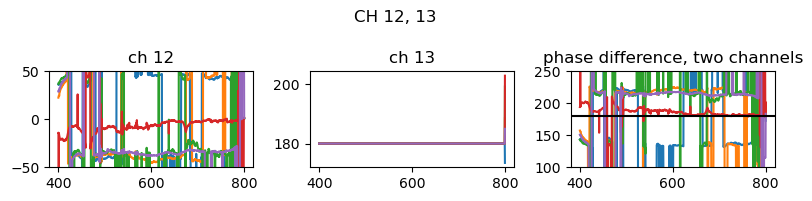

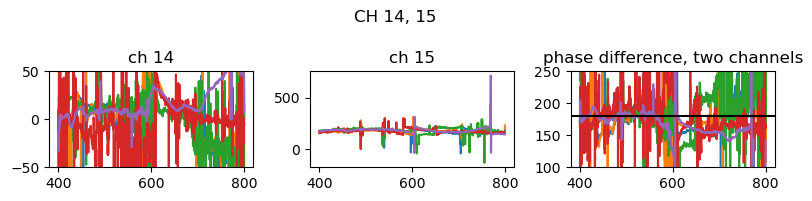

In [86]:
for chan in np.arange(0,16,2):
    figure(figsize = (8,2))
    subplot(1,3,1)
    for i in range(5): 
        evens = fits_all2[chan,i,j,:]
        plot(np.linspace(800,400,1024), evens)
    title('ch '+str(chan))
    ylim(-50,50)

    subplot(1,3,2)
    for i in range(5): 
        odds = fits_all2[chan+1,i,j,:]
        plot(np.linspace(800,400,1024), odds)
    title('ch '+str(chan+1))

    subplot(1,3,3)
    for i in range(5): 
        evens = fits_all2[chan,i,j,:]
        odds = fits_all2[chan+1,i,j,:]    
        plot(np.linspace(800,400,1024), odds - evens)
    axhline(180, color = 'k')
    ylim(100,250)

    title('phase difference, two channels')
    suptitle('CH '+str(chan)+', '+str(chan+1))
    tight_layout()
    show()



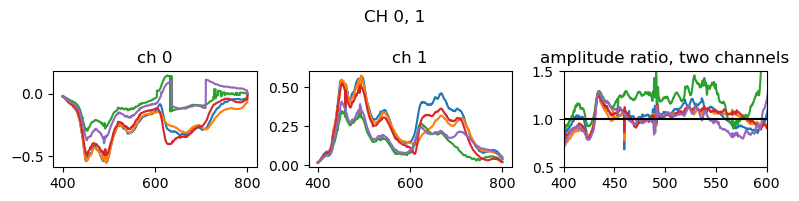

/home/erk26/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:22: RuntimeWarning: divide by zero encountered in true_divide


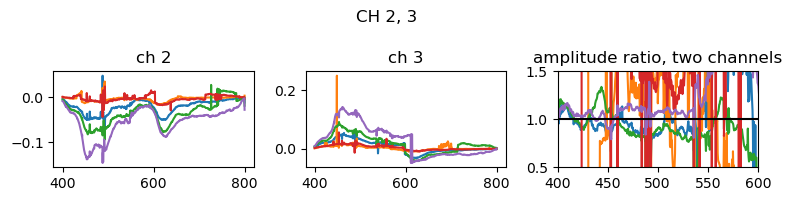

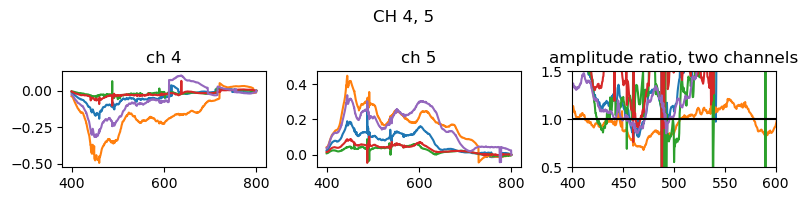

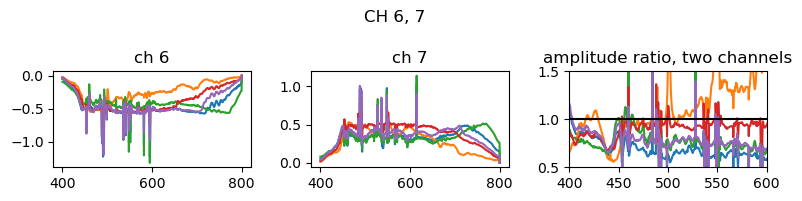

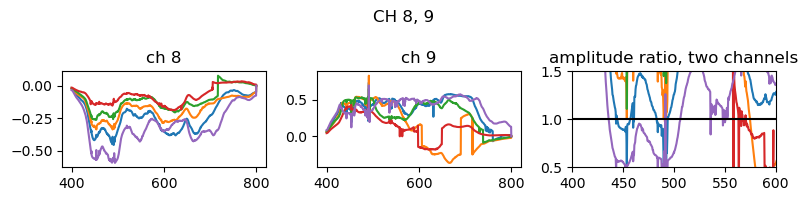

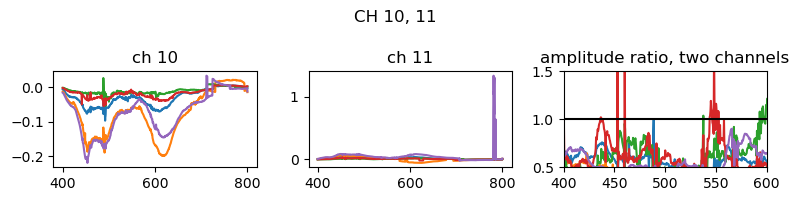

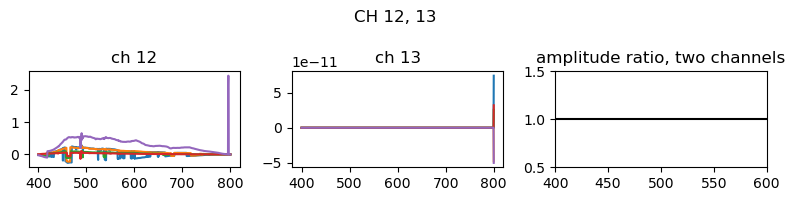

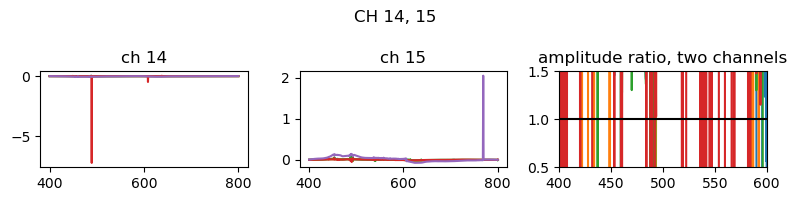

In [87]:
j = 0

for chan in np.arange(0,16,2):
    figure(figsize = (8,2))
    subplot(1,3,1)
    for i in range(5): 
        evens = fits_all2[chan,i,j,:]
        plot(np.linspace(800,400,1024), evens)
    title('ch '+str(chan))
#     ylim(-50,50)

    subplot(1,3,2)
    for i in range(5): 
        odds = fits_all2[chan+1,i,j,:]
        plot(np.linspace(800,400,1024), odds)
    title('ch '+str(chan+1))

    subplot(1,3,3)
    for i in range(5): 
        evens = fits_all2[chan,i,j,:]
        odds = fits_all2[chan+1,i,j,:]    
        plot(np.linspace(800,400,1024), -1* odds/evens)
    axhline(1, color = 'k')
#     ylim(100,250)

    ylim(0.5,1.5)
    xlim(400,600)
    title('amplitude ratio, two channels')
    suptitle('CH '+str(chan)+', '+str(chan+1))
    tight_layout()
    show()



In [88]:
fits_all.shape


(16, 5, 8, 1024)

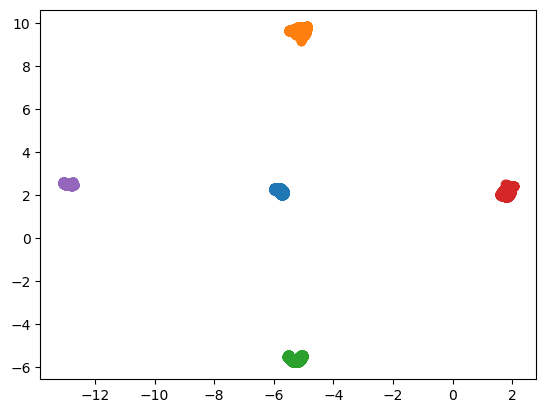

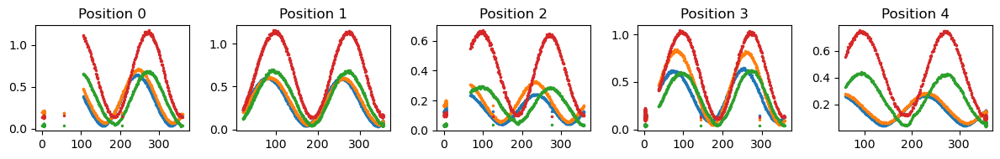

In [129]:
for i in [(7080, 7420),(8090,8700),(9150,9600),(10050,10550),(10950,11400)]:
    plot(test_concat.drone_xyz_LC_interp[i[0]:i[1],0],test_concat.drone_xyz_LC_interp[i[0]:i[1],1], 'o')
show()


# lb = 7080
# ub = 7420
# offset = 100

# for i in [(lb, ub)]:
#     plot(test_concat.drone_yaw_interp[offset:][i[0]:i[1]], test_concat.V[:,950,0][i[0]:i[1]], '.', markersize = 2)
#     plot(test_concat.drone_yaw_interp[offset:][i[0]:i[1]], test_concat.V[:,600,0][i[0]:i[1]], '.', markersize = 2)
#     plot(test_concat.drone_yaw_interp[offset:][i[0]:i[1]], test_concat.V[:,400,0][i[0]:i[1]], '.', markersize = 2)

# show()


figure(figsize = (12,2))
# subplot(1,2, 1)
offset = 100

counter = 0
# for j in enumerate([400,650,900]):
for i in [(7080, 7420),(8090,8700),(9150,9600),(10050,10550),(10950,11400)]:
    subplot(1,5,counter+1)
    for j in [250,400,650,900]:
        plot(test_concat.drone_yaw_interp[offset:][i[0]:i[1]], 1e7*test_concat.V[i[0]:i[1],j,0], '.', markersize = 3)
    title('Position ' + str(counter))
    counter +=1
tight_layout()


In [126]:
np.linspace(800,400,1024)[250]

702.2482893450635

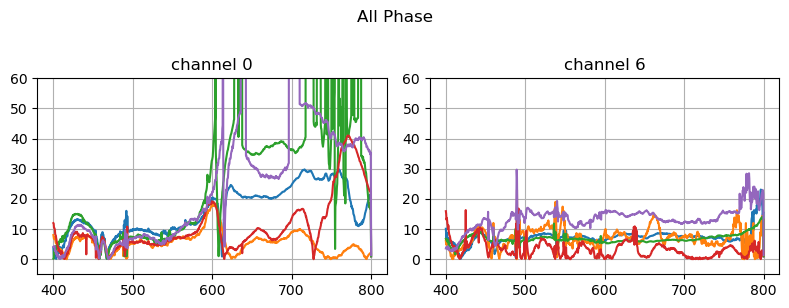

''

In [165]:
# plot phase for individual locations for both hirax and chime

figure(figsize = (8,3))
j=2
col = ['C0', 'C1', 'C2','C3','C4']
for i,k in enumerate([0,6]):
    subplot(1,2,i+1)
    for i in range(5):
        plot(np.linspace(800,400,1024), np.abs(fits_all[k,i,j,:]))
        grid()
        ylim(-5,60)
    title('channel '+str(k))
suptitle('All Phase', y=1.01)
tight_layout()
show()
""

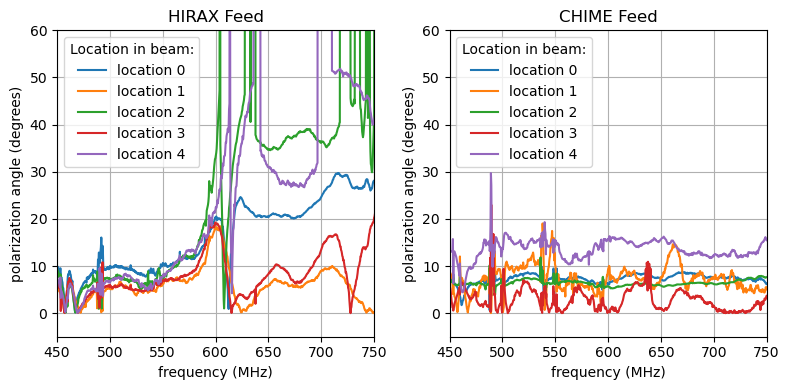

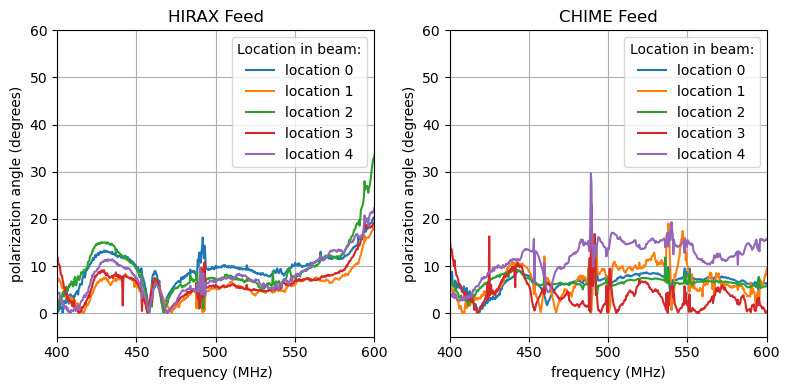

''

In [183]:
# plot phase for individual locations for both hirax and chime

figure(figsize = (8,4))
j=2
col = ['C0', 'C1', 'C2','C3','C4']

k = 0
subplot(1,2,1)
for i in range(5):
    plot(np.linspace(800,400,1024), np.abs(fits_all[k,i,j,:]), label = 'location '+str(i))
    grid()
    ylim(-5,60)
title('HIRAX Feed')
xlabel('frequency (MHz)')
ylabel('polarization angle (degrees)')
legend(title = 'Location in beam:', loc = 'upper left')
xlim(450,750)

k = 6
subplot(1,2,2)
for i in range(5):
    plot(np.linspace(800,400,1024), np.abs(fits_all[k,i,j,:]), label = 'location '+str(i))
    grid()
    ylim(-5,60)
title('CHIME Feed')
xlabel('frequency (MHz)')
ylabel('polarization angle (degrees)')
legend(title = 'Location in beam:', loc = 'upper left')
xlim(450,750)

# suptitle('All Phase', y=1.01)
tight_layout()
# show()
savefig('/home/erk26/2023/phase_v_freq750.pdf', format='pdf')

show()
close()


figure(figsize = (8,4))
j=2
col = ['C0', 'C1', 'C2','C3','C4']

k = 0
subplot(1,2,1)
for i in range(5):
    plot(np.linspace(800,400,1024), np.abs(fits_all[k,i,j,:]), label = 'location '+str(i))
    grid()
    ylim(-5,60)
title('HIRAX Feed')
xlabel('frequency (MHz)')
ylabel('polarization angle (degrees)')
xlim(400,600)
legend(title = 'Location in beam:')

k = 6
subplot(1,2,2)
for i in range(5):
    plot(np.linspace(800,400,1024), np.abs(fits_all[k,i,j,:]), label = 'location '+str(i))
    grid()
    ylim(-5,60)
title('CHIME Feed')
xlabel('frequency (MHz)')
ylabel('polarization angle (degrees)')
xlim(400,600)
legend(title = 'Location in beam:')


# suptitle('All Phase', y=1.01)
tight_layout()
# show()
savefig('/home/erk26/2023/phase_v_freq600.pdf', format='pdf')
show()
close()

""

''

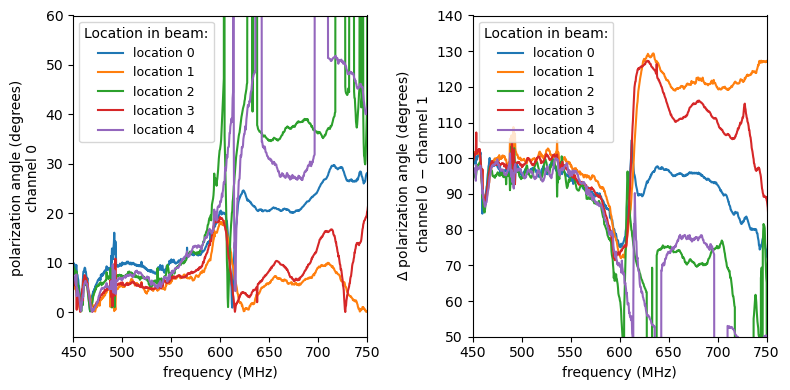

In [222]:
# plot phase for individual locations for both hirax and chime

figure(figsize = (8,4))
j=2
col = ['C0', 'C1', 'C2','C3','C4']

k = 0
subplot(1,2,1)
for i in range(5):
    plot(np.linspace(800,400,1024), np.abs(fits_all[k,i,j,:]), label = 'location '+str(i))
#     grid()
    ylim(-5,60)
# title('HIRAX Pol 1')
xlabel('frequency (MHz)')
ylabel('polarization angle (degrees) \nchannel 0 ')
legend(title = 'Location in beam:', loc = 'upper left', fontsize = 9)
xlim(450,750)

k = 1
subplot(1,2,2)
for i in range(5):
    plot(np.linspace(800,400,1024), np.abs(fits_all[1,i,j,:])-np.abs(fits_all[0,i,j,:])+90, label = 'location '+str(i))
#     grid()
    ylim(50,140)
#     ylim(-25,50)
# title('HIRAX Pol Diff')
xlabel('frequency (MHz)')
ylabel('$\Delta$ polarization angle (degrees)\n channel 0 $-$ channel 1')
legend(title = 'Location in beam:', loc = 'upper left', ncol = 1, fontsize = 9)
xlim(450,750)

# suptitle('All Phase', y=1.01)
tight_layout()
# show()
# savefig('/home/erk26/2023/phase_v_freq750.pdf', format='pdf')

# show()
# close()

""

In [240]:
10**(-3/10)

0.5011872336272722

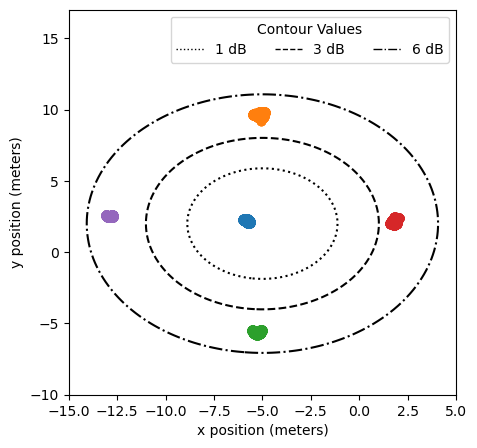

In [266]:
figure(figsize = (5,5))


def gaussian(x, y, mean, fwhm_x, fwhm_y):
    # Calculate the standard deviations
    sigma_x = fwhm_x / (2 * np.sqrt(2 * np.log(2)))
    sigma_y = fwhm_y / (2 * np.sqrt(2 * np.log(2)))
    
    # Calculate the Gaussian function values
    exponent = -((x - mean[0])**2 / (2 * sigma_x**2) + (y - mean[1])**2 / (2 * sigma_y**2))
    return np.exp(exponent)

# Define the parameters
mean = [-5, 2]  # Mean of the Gaussian
fwhm_x = 12  # FWHM along the x-axis
fwhm_y = 12   # FWHM along the y-axis

# Create a grid of x and y values
x = np.linspace(-15, 5, 100)
y = np.linspace(-10, 17, 100)
X, Y = np.meshgrid(x, y)

# Calculate the Gaussian function values for each point on the grid
Z = gaussian(X, Y, mean, fwhm_x, fwhm_y)

# Calculate the dB values for contours
max_value = np.max(Z)
dB_values = [max_value - 10**(-1/10), max_value - 10**(-3/10), max_value - 10**(-6/10)]  # Contour levels in increasing order

# Create a contour plot with different dash styles and white background
contours = plt.contour(X, Y, Z, levels=dB_values, colors='black', linestyles=['dashdot', 'dashed', 'dotted'])
gca().set_facecolor('white')

# Remove contour labels
for c in contours.collections:
    c.set_label("")

    
for i in [(7080, 7420),(8090,8700),(9150,9600),(10050,10550),(10950,11400)]:
    plot(test_concat.drone_xyz_LC_interp[i[0]:i[1],0],test_concat.drone_xyz_LC_interp[i[0]:i[1],1], 'o')

# plt.xlabel('X-axis')
# plt.ylabel('Y-axis')
# plt.title('Contour Plot of Gaussian Function (White Background)')
# colorbar(label='Gaussian Value', format='%.2f')
xlabel('x position (meters)')
ylabel('y position (meters)')
legend_labels = [f'{db} dB' for db in [1,3,6]]
legend_handles = [Line2D([0], [0], color='black', linestyle='dotted', lw=1),
                  Line2D([0], [0], color='black', linestyle='dashed', lw=1),
                  Line2D([0], [0], color='black', linestyle='dashdot', lw=1)]
legend(legend_handles, legend_labels, loc='upper right', title='Contour Values', ncol = 3)

# legend(contours.collections, legend_labels, loc='upper right', title='Contour Values')
show()


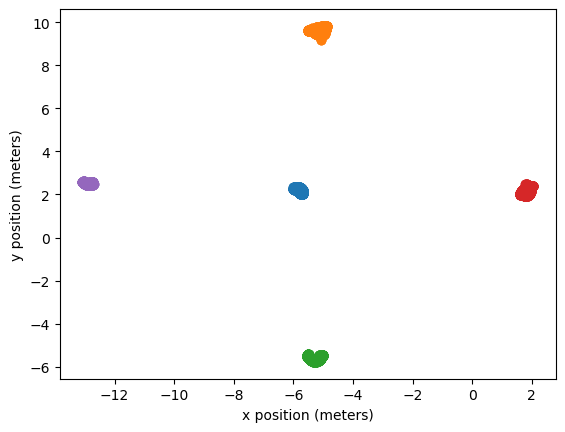

In [226]:
for i in [(7080, 7420),(8090,8700),(9150,9600),(10050,10550),(10950,11400)]:
    plot(test_concat.drone_xyz_LC_interp[i[0]:i[1],0],test_concat.drone_xyz_LC_interp[i[0]:i[1],1], 'o')
xlabel('x position (meters)')
ylabel('y position (meters)')
show()


In [184]:
# do top left and figure showing what we flew (spin points, beam overlayed)

In [267]:
# figure(figsize = (12,4))

# subplot(1,3,1)




# for i in range(5):
#     plot(np.linspace(800,400,1024), np.abs(fits_all[k,i,j,:]), label = 'location '+str(i))
#     grid()z
#     ylim(-5,60)
# title('HIRAX Feed')
# xlabel('frequency (MHz)')
# ylabel('polarization angle (degrees)')
# legend(title = 'Location in beam:', loc = 'upper left')
# xlim(450,750)


''

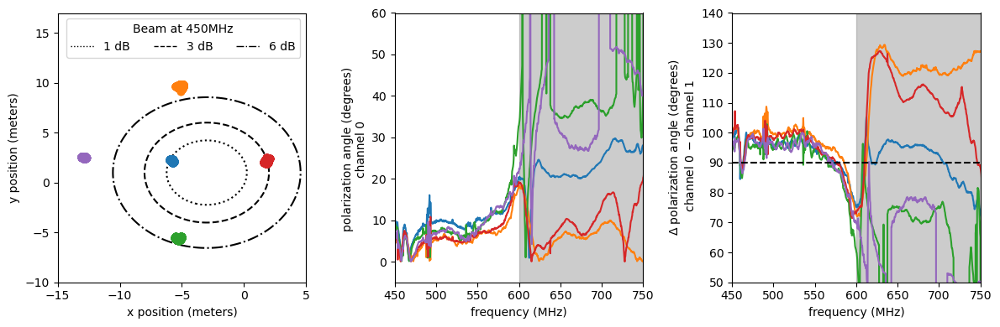

In [290]:
figure(figsize = (12,4))
j=22
col = ['C0', 'C1', 'C2','C3','C4']








subplot(1,3,1)

# Define the parameters
mean = [-3, 1]  # Mean of the Gaussian
fwhm_x = 10  # FWHM along the x-axis
fwhm_y = 10   # FWHM along the y-axis

# mean = [-3, 2.5]
# fwhm_x = 9  # FWHM along the x-axis
# fwhm_y = 9   # FWHM along the y-axis

# Create a grid of x and y values
x = np.linspace(-15, 5, 100)
y = np.linspace(-10, 17, 100)
X, Y = np.meshgrid(x, y)

# Calculate the Gaussian function values for each point on the grid
Z = gaussian(X, Y, mean, fwhm_x, fwhm_y)
contours = plt.contour(X, Y, Z, levels=dB_values, colors='black', linestyles=['dashdot', 'dashed', 'dotted'])
gca().set_facecolor('white')

# Remove contour labels
for c in contours.collections:
    c.set_label("")

    
for i in [(7080, 7420),(8090,8700),(9150,9600),(10050,10550),(10950,11400)]:
    plot(test_concat.drone_xyz_LC_interp[i[0]:i[1],0],test_concat.drone_xyz_LC_interp[i[0]:i[1],1], 'o', label = i[0])

# legend()
    

# plt.xlabel('X-axis')
# plt.ylabel('Y-axis')
# plt.title('Contour Plot of Gaussian Function (White Background)')
# colorbar(label='Gaussian Value', format='%.2f')
xlabel('x position (meters)')
ylabel('y position (meters)')
legend_labels = [f'{db} dB' for db in [1,3,6]]
legend_handles = [Line2D([0], [0], color='black', linestyle='dotted', lw=1),
                  Line2D([0], [0], color='black', linestyle='dashed', lw=1),
                  Line2D([0], [0], color='black', linestyle='dashdot', lw=1)]
legend(legend_handles, legend_labels, loc='upper right', title='Beam at 450MHz', ncol = 3)







j=2
col = ['C0', 'C1', 'C2','C3','C4']

k = 0
subplot(1,3,2)
for i in range(5):
    plot(np.linspace(800,400,1024), np.abs(fits_all[k,i,j,:]), label = 'location '+str(i))
#     grid()
    ylim(-5,60)
# title('HIRAX Pol 1')
xlabel('frequency (MHz)')
ylabel('polarization angle (degrees) \nchannel 0 ')
# legend(title = 'Location in beam:', loc = 'upper left', fontsize = 9)
xlim(450,750)
axvspan(600,800, color = 'gray', alpha = 0.4)

k = 1
subplot(1,3,3)
for i in range(5):
    plot(np.linspace(800,400,1024), np.abs(fits_all[1,i,j,:])-np.abs(fits_all[0,i,j,:])+90, label = 'location '+str(i))
#     grid()
    ylim(50,140)
#     ylim(-25,50)
# title('HIRAX Pol Diff')
xlabel('frequency (MHz)')
ylabel('$\Delta$ polarization angle (degrees)\n channel 0 $-$ channel 1')
# legend(title = 'Location in beam:', loc = 'upper left', ncol = 1, fontsize = 9)
axvspan(600,800, color = 'gray', alpha = 0.4)
axhline(90, color = 'black', linestyle = '--')
xlim(450,750)

# suptitle('All Phase', y=1.01)
tight_layout()
# show()
# savefig('/home/erk26/2023/phase_v_freq750.pdf', format='pdf')

# show()
# close()

""

''

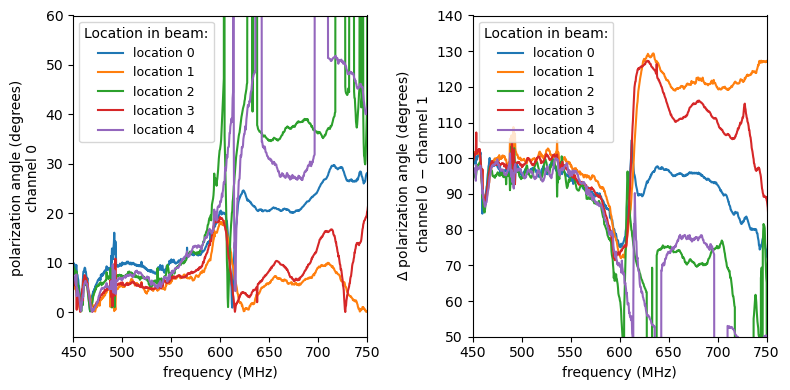

In [271]:
# plot phase for individual locations for both hirax and chime

figure(figsize = (8,4))
j=2
col = ['C0', 'C1', 'C2','C3','C4']

k = 0
subplot(1,2,1)
for i in range(5):
    plot(np.linspace(800,400,1024), np.abs(fits_all[k,i,j,:]), label = 'location '+str(i))
#     grid()
    ylim(-5,60)
# title('HIRAX Pol 1')
xlabel('frequency (MHz)')
ylabel('polarization angle (degrees) \nchannel 0 ')
legend(title = 'Location in beam:', loc = 'upper left', fontsize = 9)
xlim(450,750)

k = 1
subplot(1,2,2)
for i in range(5):
    plot(np.linspace(800,400,1024), np.abs(fits_all[1,i,j,:])-np.abs(fits_all[0,i,j,:])+90, label = 'location '+str(i))
#     grid()
    ylim(50,140)
#     ylim(-25,50)
# title('HIRAX Pol Diff')
xlabel('frequency (MHz)')
ylabel('$\Delta$ polarization angle (degrees)\n channel 0 $-$ channel 1')
legend(title = 'Location in beam:', loc = 'upper left', ncol = 1, fontsize = 9)
xlim(450,750)

# suptitle('All Phase', y=1.01)
tight_layout()
# show()
# savefig('/home/erk26/2023/phase_v_freq750.pdf', format='pdf')

# show()
# close()

""

[]

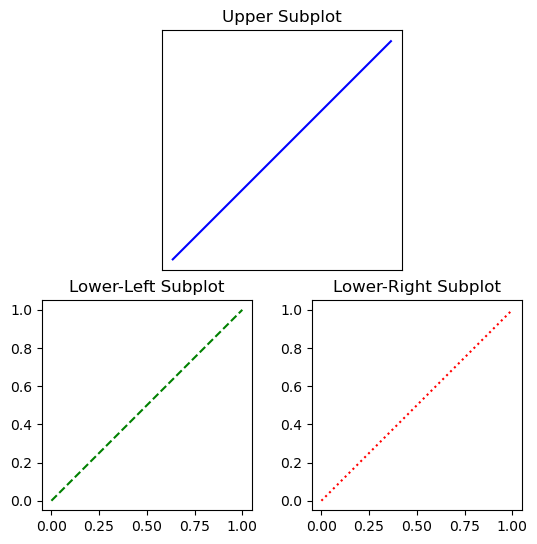

In [310]:
import matplotlib.pyplot as plt

# Create a figure with subplots
fig, ax = plt.subplots(2, 2, figsize=(6, 6))

# Remove the top-left subplot
fig.delaxes(ax[0, 0])

# Adjust subplot positions and sizes for symmetry
ax[0, 1].set_position([0.3, 0.5, 0.4, 0.4])  # Upper subplot
ax[1, 0].set_position([0.1, 0.1, 0.35, 0.35])  # Lower-left subplot
ax[1, 1].set_position([0.55, 0.1, 0.35, 0.35])  # Lower-right subplot

# Plot something in each subplot for illustration
ax[0, 1].plot([0, 1], [0, 1], 'b-')
ax[1, 0].plot([0, 1], [0, 1], 'g--')
ax[1, 1].plot([0, 1], [0, 1], 'r:')

# Set titles for the subplots
ax[0, 1].set_title('Upper Subplot')
ax[1, 0].set_title('Lower-Left Subplot')
ax[1, 1].set_title('Lower-Right Subplot')

# Hide x and y ticks for the upper subplot
ax[0, 1].set_xticks([])
ax[0, 1].set_yticks([])




[]

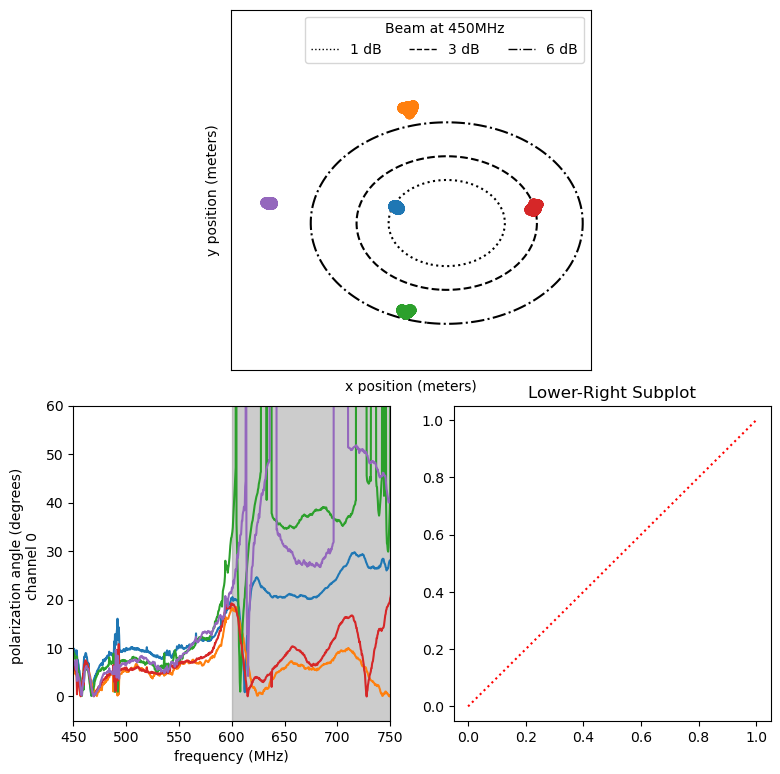

In [321]:
import matplotlib.pyplot as plt

# Create a figure with subplots
fig = plt.figure(figsize=(9, 9))

# Remove the top-right subplot
fig.delaxes(plt.subplot(2, 2, 2))

# Add the upper subplot (centered)
ax1 = plt.subplot(2, 2, 1)
ax1.set_position([0.3, 0.5, 0.4, 0.4])

contours = ax1.contour(X, Y, Z, levels=dB_values, colors='black', linestyles=['dashdot', 'dashed', 'dotted'])
gca().set_facecolor('white')

# Remove contour labels
for c in contours.collections:
    c.set_label("")

    
for i in [(7080, 7420),(8090,8700),(9150,9600),(10050,10550),(10950,11400)]:
    ax1.plot(test_concat.drone_xyz_LC_interp[i[0]:i[1],0],test_concat.drone_xyz_LC_interp[i[0]:i[1],1], 'o', label = i[0])

ax1.set_xlabel('x position (meters)')
ax1.set_ylabel('y position (meters)')
legend_labels = [f'{db} dB' for db in [1,3,6]]
legend_handles = [Line2D([0], [0], color='black', linestyle='dotted', lw=1),
                  Line2D([0], [0], color='black', linestyle='dashed', lw=1),
                  Line2D([0], [0], color='black', linestyle='dashdot', lw=1)]
ax1.legend(legend_handles, legend_labels, loc='upper right', title='Beam at 450MHz', ncol = 3)




# ax1.set_title('Upper Subplot')

# Add the lower-left subplot
ax2 = plt.subplot(2, 2, 3)
j=2
col = ['C0', 'C1', 'C2','C3','C4']

k = 0
# subplot(1,3,2)
for i in range(5):
    ax2.plot(np.linspace(800,400,1024), np.abs(fits_all[k,i,j,:]), label = 'location '+str(i))
#     grid()
    ylim(-5,60)
# title('HIRAX Pol 1')
ax2.set_xlabel('frequency (MHz)')
ax2.set_ylabel('polarization angle (degrees) \nchannel 0 ')
# legend(title = 'Location in beam:', loc = 'upper left', fontsize = 9)
ax2.set_xlim(450,750)
ax2.axvspan(600,800, color = 'gray', alpha = 0.4)






# Add the lower-right subplot
ax3 = plt.subplot(2, 2, 4)
ax3.plot([0, 1], [0, 1], 'r:')
ax3.set_title('Lower-Right Subplot')

# Hide x and y ticks for the upper subplot
ax1.set_xticks([])
ax1.set_yticks([])

# plt.tight_layout()




In [344]:
from mpl_toolkits.axes_grid1.inset_locator import inset_axes



''

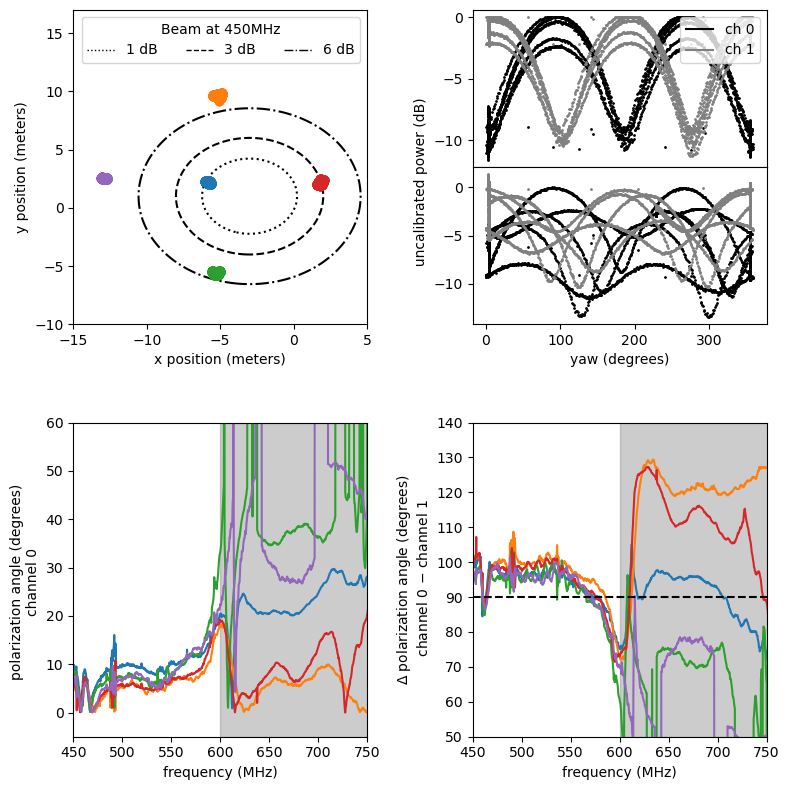

In [396]:
figure(figsize = (8,8))
j=22
col = ['C0', 'C1', 'C2','C3','C4']





subplot(2,2,1)

# Define the parameters
mean = [-3, 1]  # Mean of the Gaussian
fwhm_x = 10  # FWHM along the x-axis
fwhm_y = 10   # FWHM along the y-axis

# mean = [-3, 2.5]
# fwhm_x = 9  # FWHM along the x-axis
# fwhm_y = 9   # FWHM along the y-axis

# Create a grid of x and y values
x = np.linspace(-15, 5, 100)
y = np.linspace(-10, 17, 100)
X, Y = np.meshgrid(x, y)

# Calculate the Gaussian function values for each point on the grid
Z = gaussian(X, Y, mean, fwhm_x, fwhm_y)
contours = plt.contour(X, Y, Z, levels=dB_values, colors='black', linestyles=['dashdot', 'dashed', 'dotted'])
gca().set_facecolor('white')

# Remove contour labels
for c in contours.collections:
    c.set_label("")

    
for i in [(7080, 7420),(8090,8700),(9150,9600),(10050,10550),(10950,11400)]:
    plot(test_concat.drone_xyz_LC_interp[i[0]:i[1],0],test_concat.drone_xyz_LC_interp[i[0]:i[1],1], 'o', label = i[0])

# legend()
    

# plt.xlabel('X-axis')
# plt.ylabel('Y-axis')
# plt.title('Contour Plot of Gaussian Function (White Background)')
# colorbar(label='Gaussian Value', format='%.2f')
xlabel('x position (meters)')
ylabel('y position (meters)')
legend_labels = [f'{db} dB' for db in [1,3,6]]
legend_handles = [Line2D([0], [0], color='black', linestyle='dotted', lw=1),
                  Line2D([0], [0], color='black', linestyle='dashed', lw=1),
                  Line2D([0], [0], color='black', linestyle='dashdot', lw=1)]
legend(legend_handles, legend_labels, loc='upper right', title='Beam at 450MHz', ncol = 3)





subplot(2,2,2)

plt.gca().set_xticklabels([])  # Remove x-axis labels
plt.gca().set_yticklabels([])  # Remove y-axis labels
# Remove x and y axis ticks
plt.gca().set_xticks([])  # Remove x-axis ticks
plt.gca().set_yticks([])  # Remove y-axis ticks
# Remove plot border
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['bottom'].set_visible(False)
plt.gca().spines['left'].set_visible(False)




lb = 6600
ub = 11500
offset = 100
freq1 = 450
freq = find_indx(test_concat.freq, freq1)

# Create upper plot
left, bottom, width, height = [0, 0.5, 1, 0.5]
ax_inset = plt.gca().inset_axes([left, bottom, width, height])
ax_inset.plot(test_concat.drone_yaw_interp[lb+offset:ub+offset], 10*np.log10(test_concat.V[:,freq,0][lb:ub])\
                    -np.max(10*np.log10(test_concat.V[:,freq,0][lb:ub])), '.', markersize = 2, color = 'black')
ax_inset.plot(test_concat.drone_yaw_interp[lb+offset:ub+offset], 10*np.log10(test_concat.V[:,freq,1][lb:ub])\
                    -np.max(10*np.log10(test_concat.V[:,freq,0][lb:ub])), '.', markersize = 2, color = 'gray')

ax_inset.plot(0,0, color = 'black', label = 'ch 0')
ax_inset.plot(0,0, color = 'gray', label = 'ch 1')
ax_inset.legend(loc = 'upper right')

#create lower plot
freq1 = 750
freq = find_indx(test_concat.freq, freq1)

left, bottom, width, height = [0, 0, 1, 0.5]
ax_inset = plt.gca().inset_axes([left, bottom, width, height])
ax_inset.plot(test_concat.drone_yaw_interp[lb+offset:ub+offset], 10*np.log10(test_concat.V[:,freq,0][lb:ub])\
                    -np.max(10*np.log10(test_concat.V[:,freq,0][lb:ub])), '.', markersize = 2, color = 'k')
ax_inset.plot(test_concat.drone_yaw_interp[lb+offset:ub+offset], 10*np.log10(test_concat.V[:,freq,1][lb:ub])\
                    -np.max(10*np.log10(test_concat.V[:,freq,0][lb:ub])), '.', markersize = 2, color = 'gray')

ax_inset.set_xlabel('yaw (degrees)')
ax_inset.set_ylabel('                             uncalibrated power (dB)')


j=2
col = ['C0', 'C1', 'C2','C3','C4']

k = 0
subplot(2,2,3)
for i in range(5):
    plot(np.linspace(800,400,1024), np.abs(fits_all[k,i,j,:]), label = 'location '+str(i))
#     grid()
    ylim(-5,60)
# title('HIRAX Pol 1')
xlabel('frequency (MHz)')
ylabel('polarization angle (degrees) \nchannel 0 ')
# legend(title = 'Location in beam:', loc = 'upper left', fontsize = 9)
xlim(450,750)
axvspan(600,800, color = 'gray', alpha = 0.4)

k = 1
subplot(2,2,4)
for i in range(5):
    plot(np.linspace(800,400,1024), np.abs(fits_all[1,i,j,:])-np.abs(fits_all[0,i,j,:])+90, label = 'location '+str(i))
#     grid()
    ylim(50,140)
#     ylim(-25,50)
# title('HIRAX Pol Diff')
xlabel('frequency (MHz)')
ylabel('$\Delta$ polarization angle (degrees)\n channel 0 $-$ channel 1')
# legend(title = 'Location in beam:', loc = 'upper left', ncol = 1, fontsize = 9)
axvspan(600,800, color = 'gray', alpha = 0.4)
axhline(90, color = 'black', linestyle = '--')
xlim(450,750)

# suptitle('All Phase', y=1.01)
tight_layout()
# show()
# savefig('/home/erk26/2023/phase_v_freq750.pdf', format='pdf')

# show()
# close()

""

to do:
    - find better colors 

''

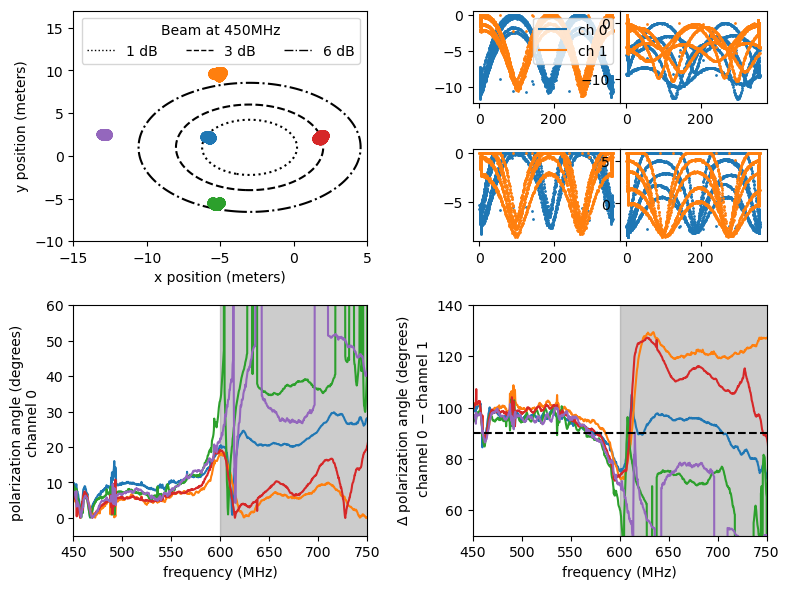

In [384]:
figure(figsize = (8,6))
j=22
col = ['C0', 'C1', 'C2','C3','C4']





subplot(2,2,1)

# Define the parameters
mean = [-3, 1]  # Mean of the Gaussian
fwhm_x = 10  # FWHM along the x-axis
fwhm_y = 10   # FWHM along the y-axis

# mean = [-3, 2.5]
# fwhm_x = 9  # FWHM along the x-axis
# fwhm_y = 9   # FWHM along the y-axis

# Create a grid of x and y values
x = np.linspace(-15, 5, 100)
y = np.linspace(-10, 17, 100)
X, Y = np.meshgrid(x, y)

# Calculate the Gaussian function values for each point on the grid
Z = gaussian(X, Y, mean, fwhm_x, fwhm_y)
contours = plt.contour(X, Y, Z, levels=dB_values, colors='black', linestyles=['dashdot', 'dashed', 'dotted'])
gca().set_facecolor('white')

# Remove contour labels
for c in contours.collections:
    c.set_label("")

    
for i in [(7080, 7420),(8090,8700),(9150,9600),(10050,10550),(10950,11400)]:
    plot(test_concat.drone_xyz_LC_interp[i[0]:i[1],0],test_concat.drone_xyz_LC_interp[i[0]:i[1],1], 'o', label = i[0])

# legend()
    

# plt.xlabel('X-axis')
# plt.ylabel('Y-axis')
# plt.title('Contour Plot of Gaussian Function (White Background)')
# colorbar(label='Gaussian Value', format='%.2f')
xlabel('x position (meters)')
ylabel('y position (meters)')
legend_labels = [f'{db} dB' for db in [1,3,6]]
legend_handles = [Line2D([0], [0], color='black', linestyle='dotted', lw=1),
                  Line2D([0], [0], color='black', linestyle='dashed', lw=1),
                  Line2D([0], [0], color='black', linestyle='dashdot', lw=1)]
legend(legend_handles, legend_labels, loc='upper right', title='Beam at 450MHz', ncol = 3)





subplot(2,2,2)

plt.gca().set_xticklabels([])  # Remove x-axis labels
plt.gca().set_yticklabels([])  # Remove y-axis labels
# Remove x and y axis ticks
plt.gca().set_xticks([])  # Remove x-axis ticks
plt.gca().set_yticks([])  # Remove y-axis ticks
# Remove plot border
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['bottom'].set_visible(False)
plt.gca().spines['left'].set_visible(False)




lb = 6600
ub = 11500
offset = 100
freq1 = 450
freq = find_indx(test_concat.freq, freq1)

# Create upper plot
left, bottom, width, height = [0, 0.6, 0.5, 0.4]
ax_inset = plt.gca().inset_axes([left, bottom, width, height])
ax_inset.plot(test_concat.drone_yaw_interp[lb+offset:ub+offset], 10*np.log10(test_concat.V[:,freq,0][lb:ub])\
                    -np.max(10*np.log10(test_concat.V[:,freq,0][lb:ub])), '.', markersize = 2)
ax_inset.plot(test_concat.drone_yaw_interp[lb+offset:ub+offset], 10*np.log10(test_concat.V[:,freq,1][lb:ub])\
                    -np.max(10*np.log10(test_concat.V[:,freq,0][lb:ub])), '.', markersize = 2)

ax_inset.plot(0,0, color = 'C0', label = 'ch 0')
ax_inset.plot(0,0, color = 'C1', label = 'ch 1')
ax_inset.legend(loc = 'upper right')

#create lower plot
freq1 = 750
freq = find_indx(test_concat.freq, freq1)

left, bottom, width, height = [0.5, 0.6, 0.5, 0.4]
ax_inset = plt.gca().inset_axes([left, bottom, width, height])
ax_inset.plot(test_concat.drone_yaw_interp[lb+offset:ub+offset], 10*np.log10(test_concat.V[:,freq,0][lb:ub])\
                    -np.max(10*np.log10(test_concat.V[:,freq,0][lb:ub])), '.', markersize = 2, label = 'ch 0')
ax_inset.plot(test_concat.drone_yaw_interp[lb+offset:ub+offset], 10*np.log10(test_concat.V[:,freq,1][lb:ub])\
                    -np.max(10*np.log10(test_concat.V[:,freq,0][lb:ub])), '.', markersize = 2, label = 'ch 1')


#create ch upper plot
freq1 = 450
freq = find_indx(test_concat.freq, freq1)

left, bottom, width, height = [0, 0, 0.5, 0.4]
ax_inset = plt.gca().inset_axes([left, bottom, width, height])
ax_inset.plot(test_concat.drone_yaw_interp[lb+offset:ub+offset], 10*np.log10(test_concat.V[:,freq,6][lb:ub])\
                    -np.max(10*np.log10(test_concat.V[:,freq,0][lb:ub])), '.', markersize = 2, label = 'ch 0')
ax_inset.plot(test_concat.drone_yaw_interp[lb+offset:ub+offset], 10*np.log10(test_concat.V[:,freq,7][lb:ub])\
                    -np.max(10*np.log10(test_concat.V[:,freq,0][lb:ub])), '.', markersize = 2, label = 'ch 1')


#create ch lower plot
freq1 = 750
freq = find_indx(test_concat.freq, freq1)

left, bottom, width, height = [0.5, 0, 0.5, 0.4]
ax_inset = plt.gca().inset_axes([left, bottom, width, height])
ax_inset.plot(test_concat.drone_yaw_interp[lb+offset:ub+offset], 10*np.log10(test_concat.V[:,freq,6][lb:ub])\
                    -np.max(10*np.log10(test_concat.V[:,freq,0][lb:ub])), '.', markersize = 2, label = 'ch 0')
ax_inset.plot(test_concat.drone_yaw_interp[lb+offset:ub+offset], 10*np.log10(test_concat.V[:,freq,7][lb:ub])\
                    -np.max(10*np.log10(test_concat.V[:,freq,0][lb:ub])), '.', markersize = 2, label = 'ch 1')











j=2
col = ['C0', 'C1', 'C2','C3','C4']

k = 0
subplot(2,2,3)
for i in range(5):
    plot(np.linspace(800,400,1024), np.abs(fits_all[k,i,j,:]), label = 'location '+str(i))
#     grid()
    ylim(-5,60)
# title('HIRAX Pol 1')
xlabel('frequency (MHz)')
ylabel('polarization angle (degrees) \nchannel 0 ')
# legend(title = 'Location in beam:', loc = 'upper left', fontsize = 9)
xlim(450,750)
axvspan(600,800, color = 'gray', alpha = 0.4)

k = 1
subplot(2,2,4)
for i in range(5):
    plot(np.linspace(800,400,1024), np.abs(fits_all[1,i,j,:])-np.abs(fits_all[0,i,j,:])+90, label = 'location '+str(i))
#     grid()
    ylim(50,140)
#     ylim(-25,50)
# title('HIRAX Pol Diff')
xlabel('frequency (MHz)')
ylabel('$\Delta$ polarization angle (degrees)\n channel 0 $-$ channel 1')
# legend(title = 'Location in beam:', loc = 'upper left', ncol = 1, fontsize = 9)
axvspan(600,800, color = 'gray', alpha = 0.4)
axhline(90, color = 'black', linestyle = '--')
xlim(450,750)

# suptitle('All Phase', y=1.01)
tight_layout()
# show()
# savefig('/home/erk26/2023/phase_v_freq750.pdf', format='pdf')

# show()
# close()

""